In [2]:
# Bootstrap: install missing deps into *this* kernel
import sys, subprocess, importlib

def ensure(pkgs):
    for p in pkgs:
        try:
            importlib.import_module(p["import"])
        except Exception:
            subprocess.check_call([sys.executable, "-m", "pip", "install", p["pip"]])

pkgs = [
    {"import":"numpy",      "pip":"numpy>=2.0"},
    {"import":"matplotlib", "pip":"matplotlib"},
    {"import":"requests",   "pip":"requests"},
    {"import":"wmi",        "pip":"wmi"},
    {"import":"win32api",   "pip":"pywin32"},   # needed by wmi on Windows
    {"import":"psutil",     "pip":"psutil"},
]

ensure(pkgs)

import sys, site
print("Python:", sys.version)
print("Interpreter:", sys.executable)
print("Site-packages:", site.getsitepackages())
print("✅ Ready. Re-run the cooling glyph cell.")


Python: 3.13.5 (tags/v3.13.5:6cb20a2, Jun 11 2025, 16:15:46) [MSC v.1943 64 bit (AMD64)]
Interpreter: C:\Users\caleb\CNT_Lab\.venv\Scripts\python.exe
Site-packages: ['C:\\Users\\caleb\\CNT_Lab\\.venv', 'C:\\Users\\caleb\\CNT_Lab\\.venv\\Lib\\site-packages']
✅ Ready. Re-run the cooling glyph cell.


== CNT Cooling Glyph Experiment ==
Duration: 180s   Load: 0.90   Thresholds: low=55.0°C, high=70.0°C
Power plans:
 
Existing Power Schemes (* Active)
-----------------------------------
Power Scheme GUID: 381b4222-f694-41f0-9685-ff5bb260df2e  (Balanced) *
Power Scheme GUID: 8c5e7fda-e8bf-4a96-9a85-a6e23a8c635c  (High performance)
Power Scheme GUID: a1841308-3541-4fab-bc81-f71556f20b4a  (Power saver)



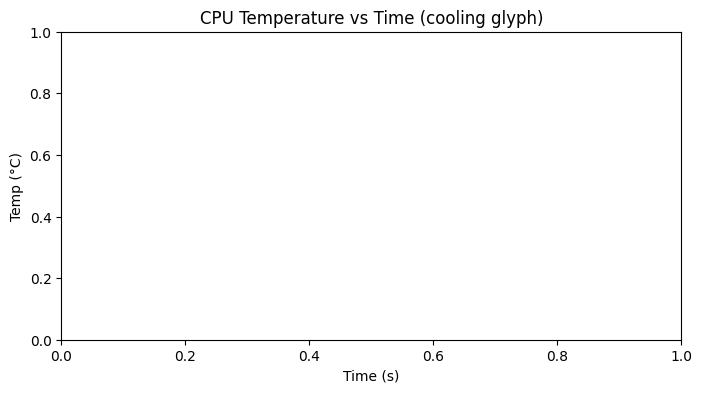

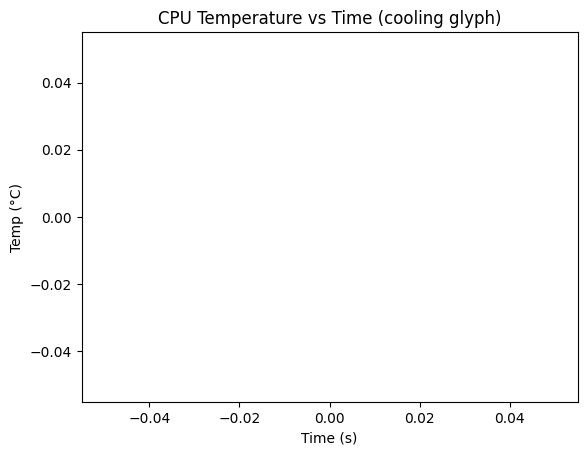

[   1.4s] Temp=nan°C → Plan=BALANCED Cooling=False Pace=0.050


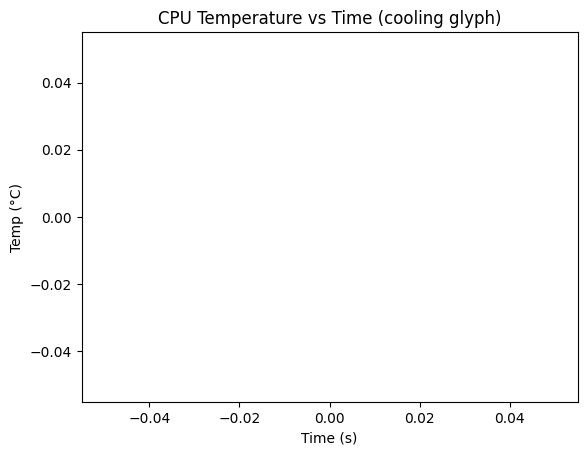

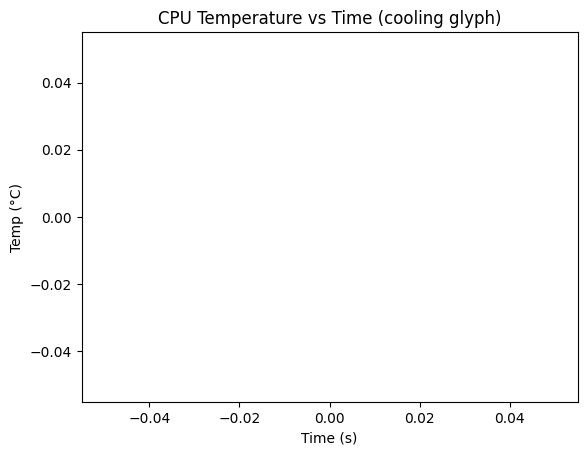

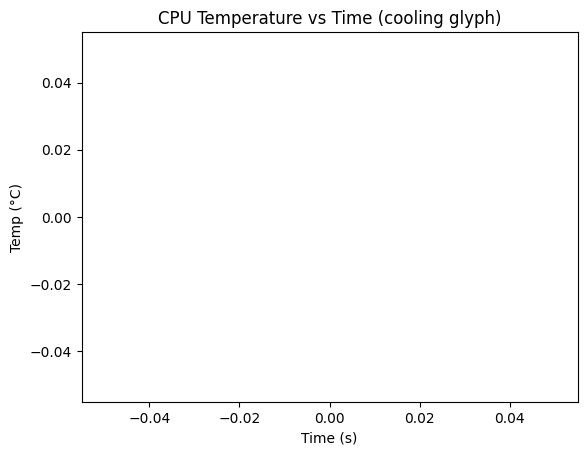

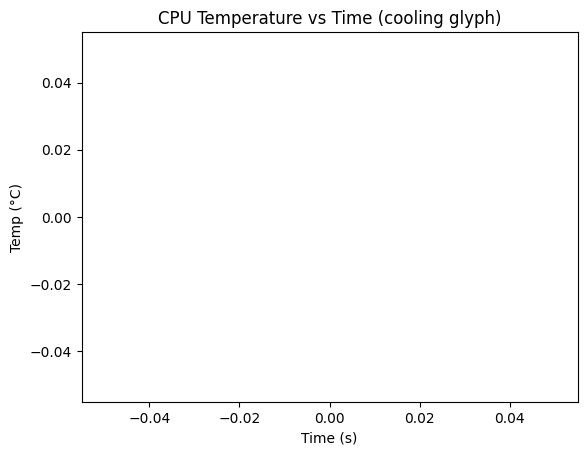

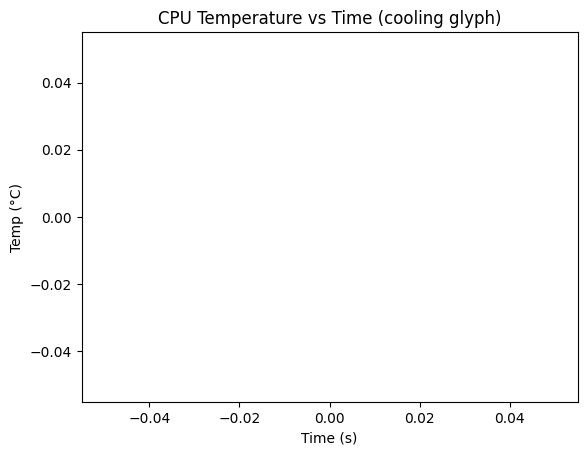

...

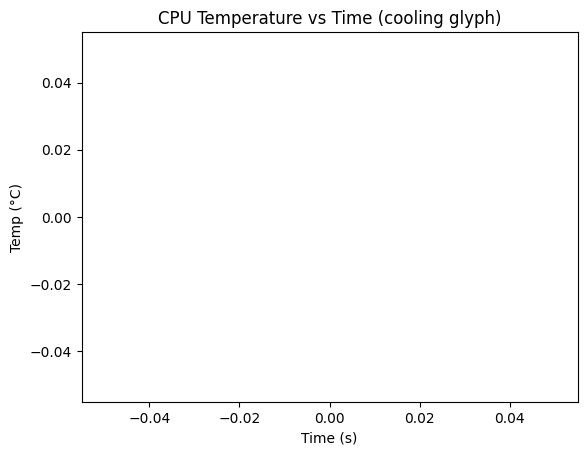

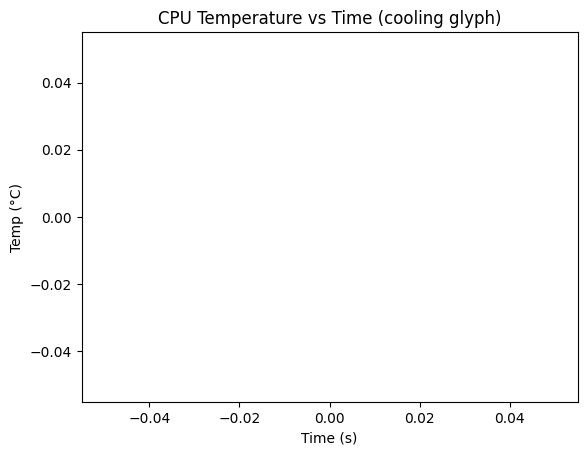

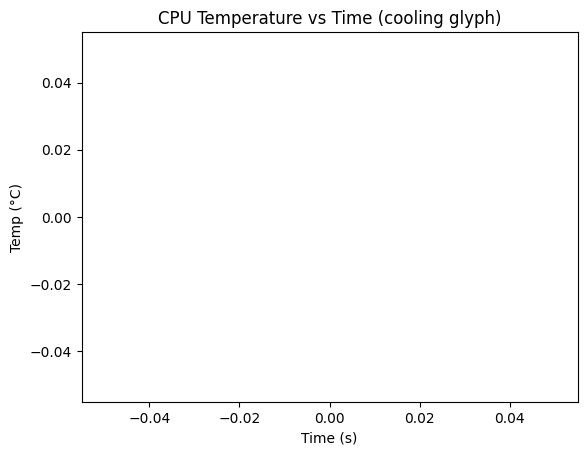

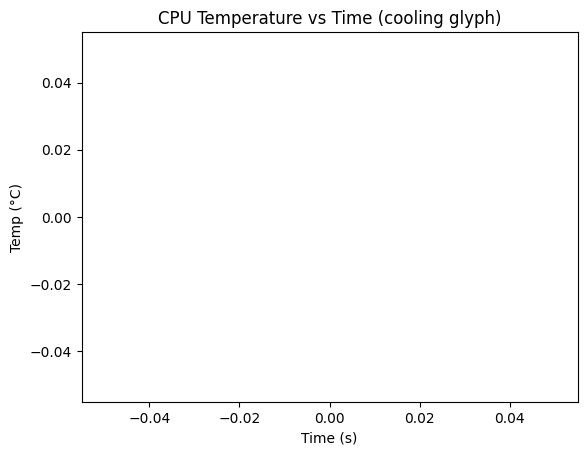

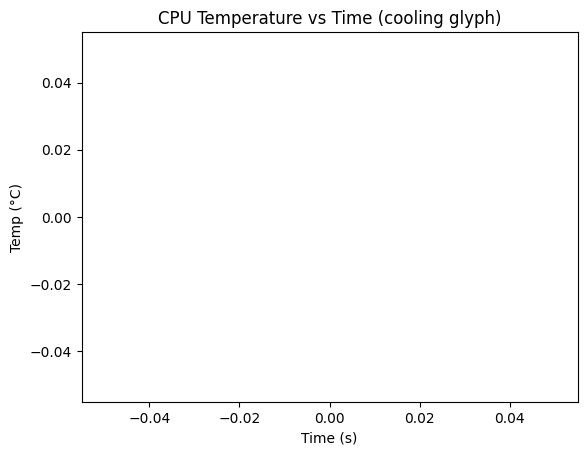


Saved log → C:\Users\caleb\CNT_Lab\notebooks\archive\cnt_cooling_log_20251015-120551.csv


KeyboardInterrupt: 

In [3]:
# === CNT Cooling Glyph: closed-loop CPU temp control experiment ===
# OS: Windows 10/11. CPU: e.g., i7-12700F
# Requirements: librehardwaremonitor (optional UI app), or openhardwaremonitor (for WMI), admin for powercfg
# Jupyter: run this in one cell.

# 1) Setup & imports
import sys, subprocess, time, json, math, threading, queue, re, os, ctypes
from datetime import datetime
import psutil
import numpy as np
import matplotlib.pyplot as plt

# Optional installs (no-ops if already present)
def _pip_install(pkgs):
    try:
        import importlib
        for p in pkgs:
            try: importlib.import_module(p)
            except Exception:
                subprocess.run([sys.executable, "-m", "pip", "install", p], check=False, stdout=subprocess.PIPE, stderr=subprocess.PIPE)
    except Exception:
        pass

_pip_install(["wmi", "requests", "matplotlib"])

import requests
import wmi

LOG_PATH = os.path.join(os.getcwd(), f"cnt_cooling_log_{datetime.now().strftime('%Y%m%d-%H%M%S')}.csv")

# 2) Temperature readers (try LHM JSON -> OHM WMI -> ACPI)
def read_temp_lhm_json():
    # LibreHardwareMonitor -> Options -> Remote Web Server (default http://localhost:8085/data.json)
    try:
        r = requests.get("http://127.0.0.1:8085/data.json", timeout=0.25)
        data = r.json()
        # Traverse once to find a CPU Package temperature
        # Structure typically has "Children" nodes with "Text", "SensorType", "Value"
        def walk(n):
            out = []
            if isinstance(n, dict):
                if n.get("SensorType") == "Temperature" and ("CPU Package" in n.get("Text","") or "Core (Tctl/Tdie)" in n.get("Text","") or "CPU" in n.get("Text","")):
                    v = n.get("Value")
                    if isinstance(v, (int,float)):
                        out.append(float(v))
                for c in n.get("Children", []):
                    out += walk(c)
            return out
        temps = walk(data)
        if temps:
            return float(np.nanmedian(temps))
    except Exception:
        pass
    return None

def read_temp_ohm_wmi():
    # OpenHardwareMonitor WMI provider
    try:
        c = wmi.WMI(namespace="root\\OpenHardwareMonitor")
        sensors = c.Sensor()
        vals = []
        for s in sensors:
            if getattr(s, "SensorType", "") == "Temperature":
                name = (getattr(s, "Name", "") or "").lower()
                if "package" in name or ("cpu" in name and "core" not in name):
                    v = getattr(s, "Value", None)
                    if v is not None:
                        vals.append(float(v))
        if not vals:
            # take median of all CPU temp sensors if package not present
            for s in sensors:
                if s.SensorType == "Temperature" and "cpu" in (s.Name or "").lower():
                    if s.Value is not None:
                        vals.append(float(s.Value))
        if vals:
            return float(np.nanmedian(vals))
    except Exception:
        pass
    return None

def read_temp_acpi():
    # ACPI thermal zones; coarse & may be 27.3C offsets
    try:
        # Use PowerShell CIM to avoid locale issues
        cmd = ["powershell", "-NoProfile", "-Command",
               "(Get-CimInstance MSAcpi_ThermalZoneTemperature -Namespace root/wmi | Select-Object -First 1).CurrentTemperature"]
        p = subprocess.run(cmd, capture_output=True, text=True, timeout=1.0)
        txt = (p.stdout or "").strip()
        if txt:
            # ACPI returns tenths of Kelvin
            t10K = float(txt)
            celsius = (t10K / 10.0) - 273.15
            if 0 < celsius < 120:
                return celsius
    except Exception:
        pass
    return None

def read_cpu_temp():
    for fn in (read_temp_lhm_json, read_temp_ohm_wmi, read_temp_acpi):
        v = fn()
        if v is not None:
            return float(v)
    return float("nan")

# 3) Power plan helpers (Windows)
def set_power_plan(alias="SCHEME_BALANCED"):
    # aliases: SCHEME_MIN (Power saver), SCHEME_BALANCED, SCHEME_MAX (High performance)
    try:
        subprocess.run(["powercfg", "/SETACTIVE", alias], capture_output=True, text=True, timeout=1.0)
        return True
    except Exception:
        return False

def current_power_plans():
    try:
        p = subprocess.run(["powercfg", "/L"], capture_output=True, text=True, timeout=1.5)
        return p.stdout
    except Exception:
        return ""

# 4) Cooling glyph controller
class CoolingGlyph:
    def __init__(self, t_low=55.0, t_high=70.0, cool_sleep=0.050):
        self.t_low = t_low       # below this, resume normal
        self.t_high = t_high     # above this, engage cooling
        self.cool_sleep = cool_sleep
        self.cooling = False
        self.plan_state = "BALANCED"
        # lower the priority of this Python proc (Windows only)
        try:
            p = psutil.Process()
            p.nice(psutil.BELOW_NORMAL_PRIORITY_CLASS)
        except Exception:
            pass

    def step(self, temp_c):
        if math.isnan(temp_c): 
            return self.plan_state, self.cooling, self.cool_sleep

        if temp_c >= self.t_high and not self.cooling:
            # Engage cooling
            set_power_plan("SCHEME_MIN")
            self.plan_state = "POWER_SAVER"
            self.cooling = True
        elif temp_c <= self.t_low and self.cooling:
            # Disengage cooling
            set_power_plan("SCHEME_BALANCED")
            self.plan_state = "BALANCED"
            self.cooling = False

        # adaptive pacing: stronger sleeps when hotter
        pace = self.cool_sleep
        if self.cooling:
            # map temp to extra pacing (linear ramp 70→85°C)
            pace = min(0.200, self.cool_sleep + max(0.0, (temp_c - self.t_high)) * 0.006)
        return self.plan_state, self.cooling, pace

# 5) Synthetic CPU workload we can modulate
def cpu_burn(stop_event, intensity=1.0, pace=0.0):
    # intensity in [0,1]: fraction of cycles busy
    # pace: extra sleep to back off
    # We do short bursts to allow pre-emption for temperature checks (~10ms granularity)
    busy_ns = int(5e6 * max(0.0, min(1.0, intensity)))   # nanoseconds busy per loop
    while not stop_event.is_set():
        t0 = time.perf_counter_ns()
        # busy spin
        while (time.perf_counter_ns() - t0) < busy_ns:
            pass
        # relax
        time.sleep(0.005 + pace)

# 6) Experiment loop
def run_experiment(duration_s=180, target_load=0.85, t_low=55.0, t_high=70.0):
    glyph = CoolingGlyph(t_low=t_low, t_high=t_high, cool_sleep=0.050)
    stop = threading.Event()
    worker = threading.Thread(target=cpu_burn, args=(stop, target_load, 0.0), daemon=True)
    worker.start()

    print(f"== CNT Cooling Glyph Experiment ==")
    print(f"Duration: {duration_s}s   Load: {target_load:.2f}   Thresholds: low={t_low}°C, high={t_high}°C")
    print("Power plans:\n", current_power_plans())

    records = []
    t_start = time.time()
    last_plan = None
    live_x, live_y = [], []

    plt.figure(figsize=(8,4))
    plt.title("CPU Temperature vs Time (cooling glyph)")
    plt.xlabel("Time (s)")
    plt.ylabel("Temp (°C)")
    plt.ion()
    plt.show()

    try:
        while (time.time() - t_start) < duration_s:
            tc = read_cpu_temp()
            plan, cooling, pace = glyph.step(tc)
            # update worker pace by restarting with new pace (simple approach)
            # we’ll pass pace through a shared variable (lightweight hack):
            # instead of recreating thread, just sleep extra here to emulate pacing at loop level
            # (the worker already sleeps per-iteration; we add here to reinforce)
            now = time.time() - t_start
            records.append((now, tc, plan, int(cooling), target_load, pace))
            # live plot
            live_x.append(now); live_y.append(tc if not math.isnan(tc) else np.nan)
            plt.cla()
            plt.title("CPU Temperature vs Time (cooling glyph)")
            plt.xlabel("Time (s)")
            plt.ylabel("Temp (°C)")
            plt.plot(live_x, live_y)
            plt.pause(0.01)

            if plan != last_plan:
                print(f"[{now:6.1f}s] Temp={tc:.1f}°C → Plan={plan} Cooling={cooling} Pace={pace:.3f}")
                last_plan = plan

            # reinforce pacing at controller layer
            time.sleep(0.25 + pace)
    finally:
        stop.set()
        worker.join(timeout=1.0)
        # back to balanced at end
        set_power_plan("SCHEME_BALANCED")
        # save log
        with open(LOG_PATH, "w", encoding="utf-8") as f:
            f.write("t_sec,temp_c,plan,cooling,load,pace\n")
            for r in records:
                f.write(",".join(str(x) for x in r) + "\n")
        print(f"\nSaved log → {LOG_PATH}")

# 7) Run it
# Adjust duration, thresholds to your machine. Start with a short 90–180s pass.
run_experiment(duration_s=180, target_load=0.90, t_low=55.0, t_high=70.0)


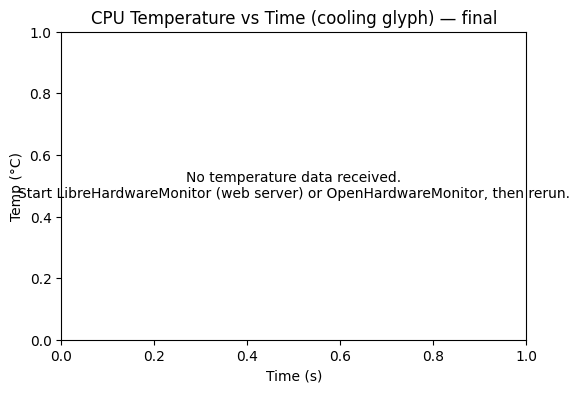

Saved log → C:\Users\caleb\CNT_Lab\notebooks\archive\cnt_cooling_log_20251015-121130.csv


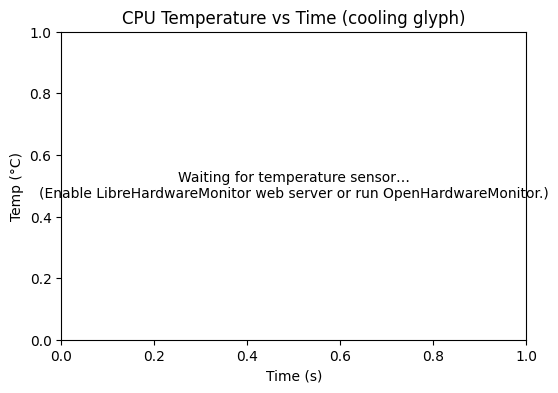

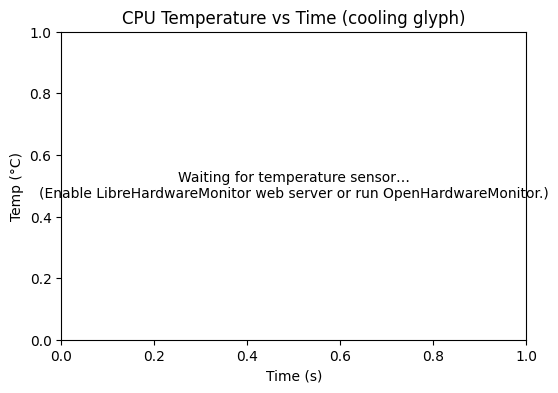

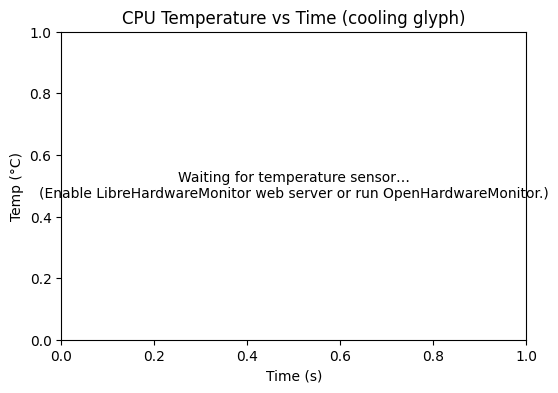

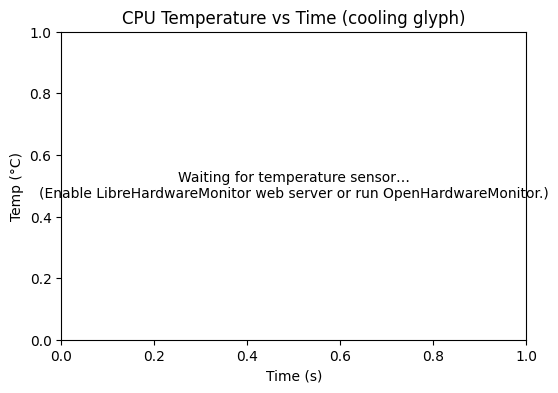

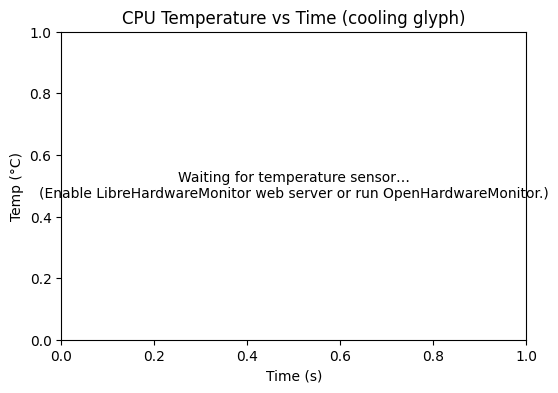

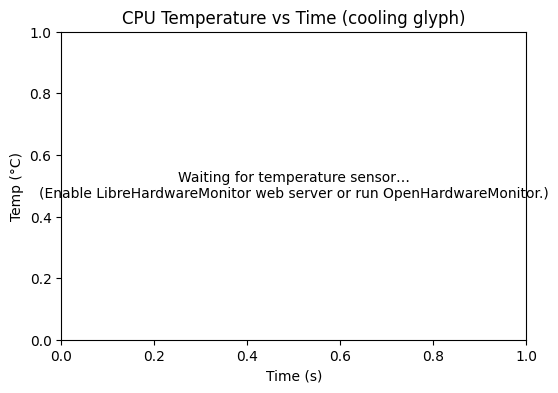

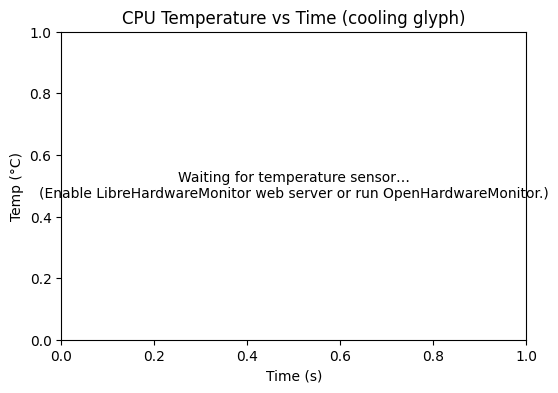

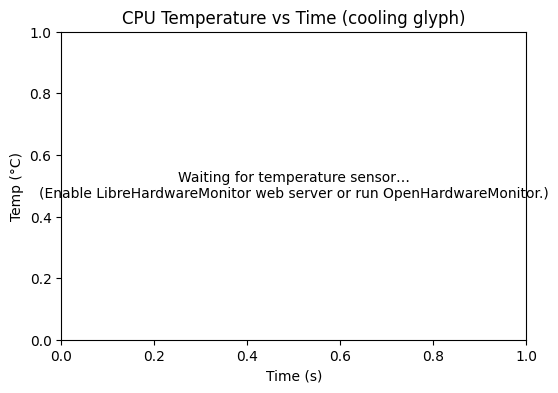

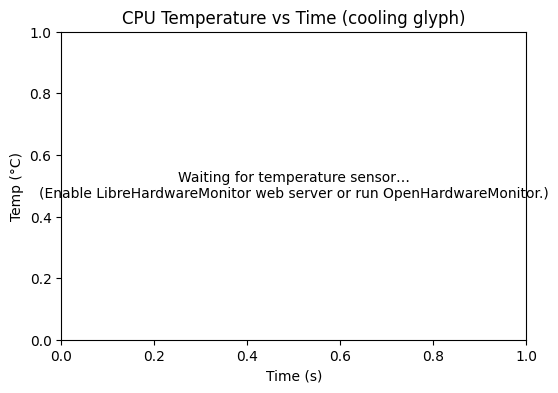

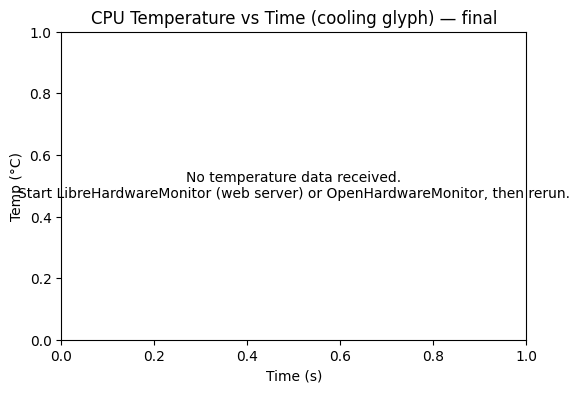

In [4]:
# === CNT Cooling Glyph — One-Cell Closed-Loop Experiment (Windows) ===
# Sense → Decide → Act → Log, with single live canvas (no PNG spam).

# ── 0) Bootstrap ─────────────────────────────────────────────────────
import sys, subprocess, importlib, os, time, math, threading, json
from datetime import datetime

def _ensure(pkgs):
    for pip_name, import_name in pkgs:
        try: importlib.import_module(import_name)
        except Exception:
            subprocess.check_call([sys.executable, "-m", "pip", "install", pip_name])

_ensure([
    ("numpy>=2.0", "numpy"),
    ("matplotlib", "matplotlib"),
    ("requests", "requests"),
    ("wmi", "wmi"),         # for OpenHardwareMonitor WMI
    ("pywin32", "win32api"),
    ("psutil", "psutil"),
])

import numpy as np, psutil, requests
from IPython.display import clear_output, display
import matplotlib.pyplot as plt

# ── 1) Temperature readers (LHM JSON → OHM WMI → ACPI fallback) ──────
def read_temp_lhm():
    """LibreHardwareMonitor: enable Options → Remote Web Server (default 127.0.0.1:8085)."""
    try:
        r = requests.get("http://127.0.0.1:8085/data.json", timeout=0.4)
        data = r.json()
        def walk(n):
            out=[]
            if isinstance(n, dict):
                if n.get("SensorType")=="Temperature" and any(k in (n.get("Text","") or "") for k in ["CPU Package","Tctl","CPU"]):
                    v=n.get("Value")
                    if isinstance(v,(int,float)): out.append(float(v))
                for c in n.get("Children",[]): out+=walk(c)
            return out
        vs = walk(data)
        return float(np.nanmedian(vs)) if vs else None
    except Exception:
        return None

def read_temp_ohm_wmi():
    """OpenHardwareMonitor WMI: run OHM as admin so namespace root\\OpenHardwareMonitor exists."""
    try:
        import wmi
        c = wmi.WMI(namespace="root\\OpenHardwareMonitor")
        vals=[]
        for s in c.Sensor():
            if getattr(s,"SensorType","")=="Temperature":
                name=(getattr(s,"Name","") or "").lower()
                if "package" in name or ("cpu" in name and "core" not in name):
                    v=getattr(s,"Value",None)
                    if v is not None: vals.append(float(v))
        if not vals:  # fallback: any CPU temps
            for s in c.Sensor():
                if getattr(s,"SensorType","")=="Temperature" and "cpu" in (getattr(s,"Name","") or "").lower():
                    v=getattr(s,"Value",None)
                    if v is not None: vals.append(float(v))
        return float(np.nanmedian(vals)) if vals else None
    except Exception:
        return None

def read_temp_acpi():
    """Very coarse; not present on all systems; units are 1/10 Kelvin."""
    try:
        p = subprocess.run(
            ["powershell","-NoProfile","-Command",
             "(Get-CimInstance MSAcpi_ThermalZoneTemperature -Namespace root/wmi | Select-Object -First 1).CurrentTemperature"],
            capture_output=True, text=True, timeout=1.5)
        raw = (p.stdout or "").strip()
        if raw:
            t = float(raw)/10.0 - 273.15
            if 0 < t < 120: return t
    except Exception:
        pass
    return None

READERS = (read_temp_lhm, read_temp_ohm_wmi, read_temp_acpi)
def read_temp():
    for fn in READERS:
        v = fn()
        if v is not None: return v
    return float("nan")

# ── 2) Actuators (power plan + pacing) ───────────────────────────────
def set_power_plan(alias="SCHEME_BALANCED"):
    # SCHEME_MIN (Power saver), SCHEME_BALANCED, SCHEME_MAX (High performance)
    try:
        subprocess.run(["powercfg","/SETACTIVE", alias], capture_output=True, text=True, timeout=1.0)
        return True
    except Exception:
        return False

class CoolingGlyph:
    """Hysteresis controller with adaptive pacing."""
    def __init__(self, t_low=55.0, t_high=70.0, base_sleep=0.05):
        self.t_low=t_low; self.t_high=t_high
        self.cooling=False; self.plan="BALANCED"; self.base_sleep=base_sleep
        try: psutil.Process().nice(psutil.BELOW_NORMAL_PRIORITY_CLASS)
        except Exception: pass
    def step(self, T):
        if math.isnan(T): return self.plan, self.cooling, self.base_sleep
        if T>=self.t_high and not self.cooling:
            set_power_plan("SCHEME_MIN"); self.plan="POWER_SAVER"; self.cooling=True
        elif T<=self.t_low and self.cooling:
            set_power_plan("SCHEME_BALANCED"); self.plan="BALANCED"; self.cooling=False
        pace = self.base_sleep if not self.cooling else min(0.200, self.base_sleep + max(0, T-self.t_high)*0.006)
        return self.plan, self.cooling, pace

# ── 3) Synthetic workload (to provoke/observe control) ───────────────
def cpu_burn(stop_evt, intensity=0.90):
    busy_ns = int(5e6*max(0.0,min(1.0,intensity)))
    while not stop_evt.is_set():
        t0=time.perf_counter_ns()
        while (time.perf_counter_ns()-t0)<busy_ns: 
            pass
        time.sleep(0.005)

# ── 4) Run: single-canvas live plot, auto-bail on missing sensors ────
def run_experiment(duration_s=150, target_load=0.90, t_low=55.0, t_high=70.0, no_data_grace_s=12.0):
    glyph = CoolingGlyph(t_low,t_high,base_sleep=0.05)
    stop = threading.Event()
    worker = threading.Thread(target=cpu_burn, args=(stop,target_load), daemon=True); worker.start()

    log_path = os.path.join(os.getcwd(), f"cnt_cooling_log_{datetime.now().strftime('%Y%m%d-%H%M%S')}.csv")
    xs, ys, plans, paces = [], [], [], []
    t0 = time.time(); nan_window_start = None

    while (time.time()-t0) < duration_s:
        T = read_temp()
        now = time.time()-t0
        plan,cooling,pace = glyph.step(T)
        xs.append(now); ys.append(T); plans.append(plan); paces.append(pace)

        # Live single canvas (no plot spam)
        clear_output(wait=True)
        plt.figure(figsize=(6,4))
        plt.title("CPU Temperature vs Time (cooling glyph)")
        plt.xlabel("Time (s)"); plt.ylabel("Temp (°C)")
        if not (len(ys)==0 or all(math.isnan(v) for v in ys)):
            plt.plot(xs, ys)
        else:
            plt.text(0.5,0.5,"Waiting for temperature sensor…\n(Enable LibreHardwareMonitor web server or run OpenHardwareMonitor.)",
                     ha="center", va="center", transform=plt.gca().transAxes)
        display(plt.gcf())

        # No-data watchdog
        if math.isnan(T):
            if nan_window_start is None: nan_window_start = time.time()
            if (time.time()-nan_window_start) > no_data_grace_s:
                break
        else:
            nan_window_start = None

        time.sleep(0.25 + pace)

    # Cleanup
    stop.set(); worker.join(timeout=1.0)
    set_power_plan("SCHEME_BALANCED")

    # Save CSV
    with open(log_path, "w", encoding="utf-8") as f:
        f.write("t_sec,temp_c,plan,pace\n")
        for a,b,c,d in zip(xs,ys,plans,paces):
            f.write(f"{a:.3f},{('' if (isinstance(b,float) and math.isnan(b)) else f'{b:.1f}')},{c},{d:.3f}\n")

    # Final frame
    clear_output(wait=True)
    plt.figure(figsize=(6,4))
    plt.title("CPU Temperature vs Time (cooling glyph) — final")
    plt.xlabel("Time (s)"); plt.ylabel("Temp (°C)")
    if len(ys) and not all(math.isnan(v) for v in ys):
        plt.plot(xs, ys)
    else:
        plt.text(0.5,0.5,"No temperature data received.\nStart LibreHardwareMonitor (web server) or OpenHardwareMonitor, then rerun.",
                 ha="center", va="center", transform=plt.gca().transAxes)
    display(plt.gcf())
    print(f"Saved log → {log_path}")

# ── 5) Quick sensor printout (one line) + launch ─────────────────────
srcs = {"LHM": read_temp_lhm() is not None, "OHM_WMI": read_temp_ohm_wmi() is not None}
print("Sensors seen →", {k:bool(v) for k,v in srcs.items()}, "(ACPI fallback auto-tried)")
run_experiment(duration_s=150, target_load=0.90, t_low=55.0, t_high=70.0, no_data_grace_s=12.0)


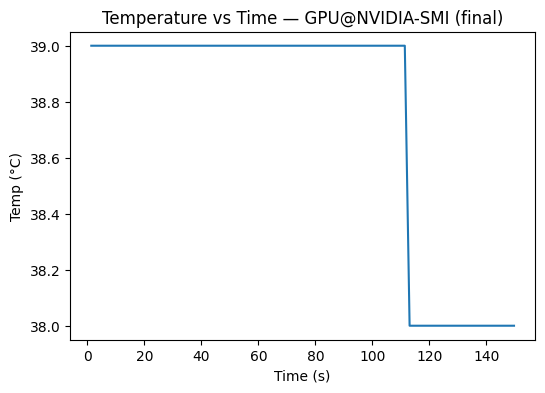

Sensors tried: LHM, OHM(WMI), ACPI, NVIDIA-SMI
Selected: GPU@NVIDIA-SMI
Saved log → C:\Users\caleb\CNT_Lab\notebooks\archive\cnt_cooling_log_20251015-121543.csv


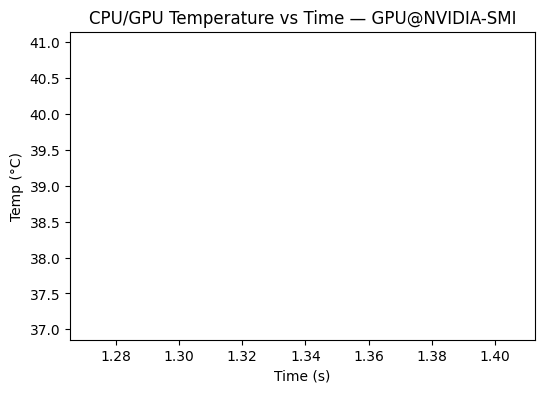

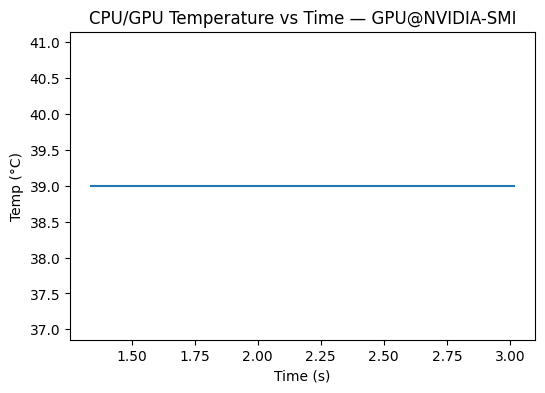

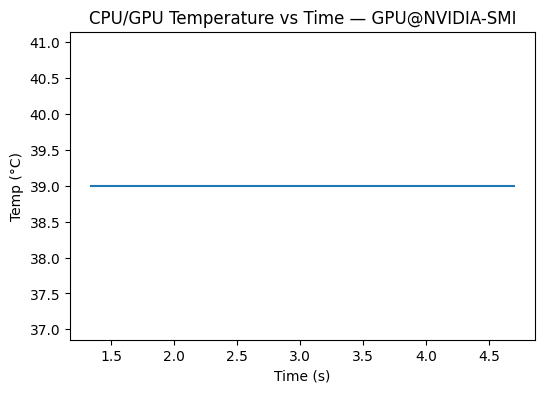

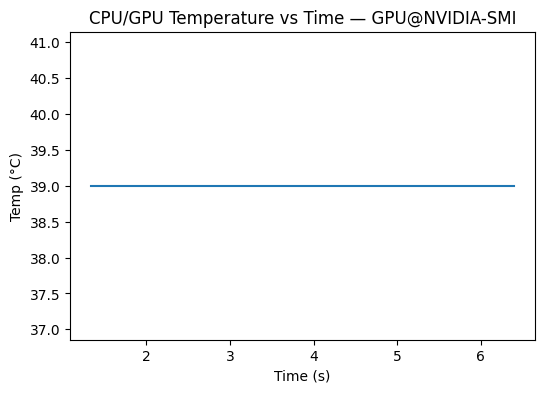

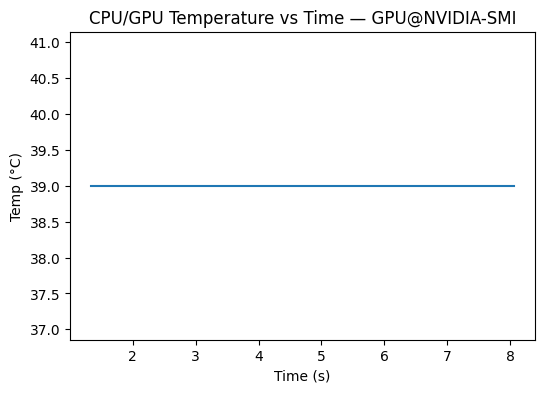

...

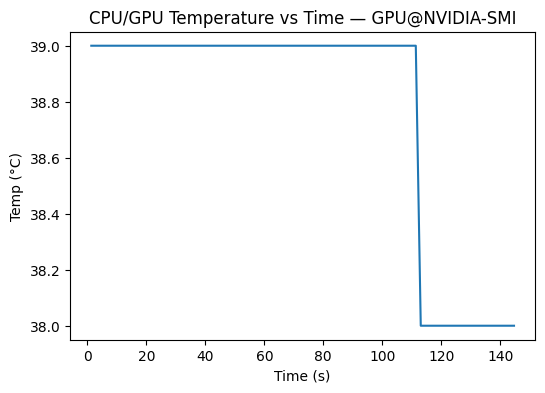

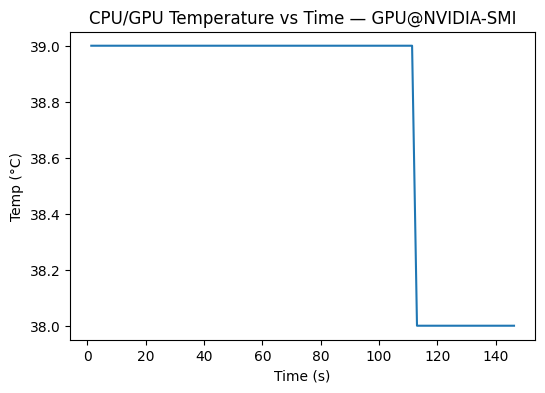

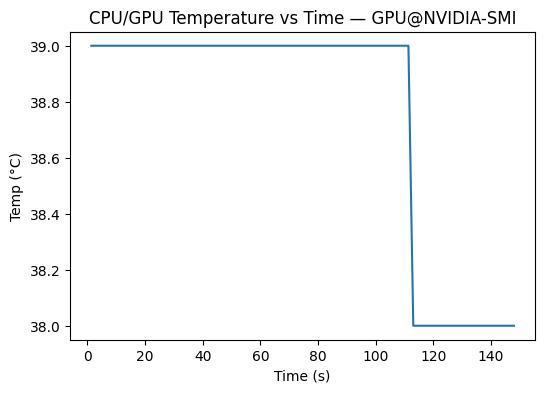

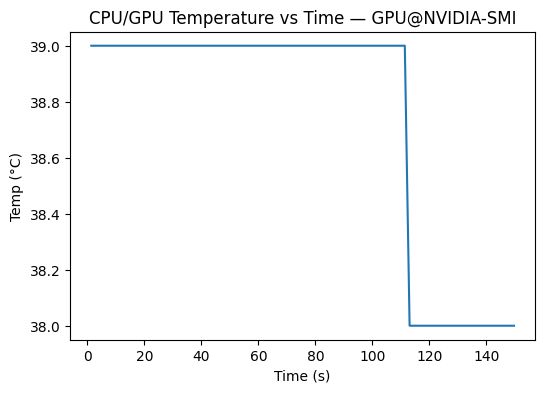

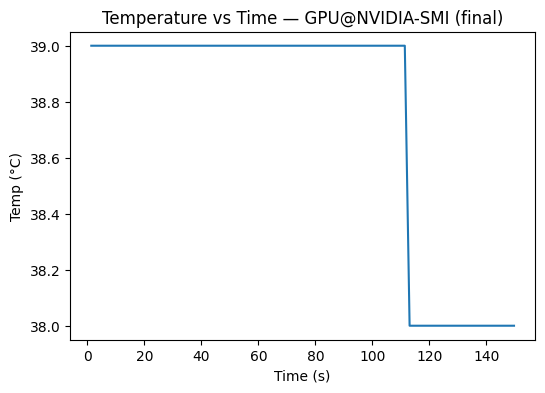

In [5]:
# === CNT Cooling Glyph — One-Cell (with robust sensor fallbacks) ===
# Windows JupyterLab. Sense → Decide → Act → Log. Single live canvas, no plot spam.

# ── Bootstrap ────────────────────────────────────────────────────────
import sys, subprocess, importlib, os, time, math, threading
from datetime import datetime

def _ensure(pkgs):
    for pip_name, import_name in pkgs:
        try: importlib.import_module(import_name)
        except Exception:
            subprocess.check_call([sys.executable, "-m", "pip", "install", pip_name])

_ensure([
    ("numpy>=2.0","numpy"),
    ("matplotlib","matplotlib"),
    ("requests","requests"),
    ("wmi","wmi"),           # OpenHardwareMonitor via WMI
    ("pywin32","win32api"),
    ("psutil","psutil"),
])

import numpy as np, psutil, requests
from IPython.display import clear_output, display
import matplotlib.pyplot as plt

# ── Readers: LHM JSON → OHM WMI → ACPI → NVIDIA GPU (nvidia-smi) ─────
SENSOR_NAME = None

def read_temp_lhm():
    """LibreHardwareMonitor: Options → Remote Web Server (keep 127.0.0.1:8085)."""
    global SENSOR_NAME
    try:
        r = requests.get("http://127.0.0.1:8085/data.json", timeout=0.4)
        data = r.json()
        def walk(n):
            out=[]
            if isinstance(n, dict):
                if n.get("SensorType")=="Temperature" and any(k in (n.get("Text","") or "") for k in ["CPU Package","Tctl","CPU"]):
                    v=n.get("Value"); 
                    if isinstance(v,(int,float)): out.append(float(v))
                for c in n.get("Children",[]): out+=walk(c)
            return out
        vs = walk(data)
        if vs:
            SENSOR_NAME = "CPU@LibreHardwareMonitor"
            return float(np.nanmedian(vs))
    except Exception:
        pass
    return None

def read_temp_ohm_wmi():
    """OpenHardwareMonitor WMI: run OHM as admin so root\\OpenHardwareMonitor exists."""
    global SENSOR_NAME
    try:
        import wmi
        c = wmi.WMI(namespace="root\\OpenHardwareMonitor")
        vals=[]
        for s in c.Sensor():
            if getattr(s,"SensorType","")=="Temperature":
                name=(getattr(s,"Name","") or "").lower()
                if "package" in name or ("cpu" in name and "core" not in name):
                    v=getattr(s,"Value",None)
                    if v is not None: vals.append(float(v))
        if not vals:
            for s in c.Sensor():
                if getattr(s,"SensorType","")=="Temperature" and "cpu" in (getattr(s,"Name","") or "").lower():
                    v=getattr(s,"Value",None)
                    if v is not None: vals.append(float(v))
        if vals:
            SENSOR_NAME = "CPU@OpenHardwareMonitor(WMI)"
            return float(np.nanmedian(vals))
    except Exception:
        pass
    return None

def read_temp_acpi():
    """Very coarse; not on all boards; units are 1/10 Kelvin."""
    global SENSOR_NAME
    try:
        p = subprocess.run(
            ["powershell","-NoProfile","-Command",
             "(Get-CimInstance MSAcpi_ThermalZoneTemperature -Namespace root/wmi | Select-Object -First 1).CurrentTemperature"],
            capture_output=True, text=True, timeout=1.5)
        raw = (p.stdout or "").strip()
        if raw:
            t = float(raw)/10.0 - 273.15
            if 0 < t < 120:
                SENSOR_NAME = "ACPI Thermal Zone"
                return t
    except Exception:
        pass
    return None

def read_temp_nvidia():
    """GPU fallback via nvidia-smi (works even if CPU sensors are hidden)."""
    global SENSOR_NAME
    try:
        p = subprocess.run(
            ["nvidia-smi","--query-gpu=temperature.gpu","--format=csv,noheader,nounits"],
            capture_output=True, text=True, timeout=1.0)
        raw = (p.stdout or "").strip().splitlines()
        vals = [float(x) for x in raw if x.strip().isdigit() or x.strip().replace('.','',1).isdigit()]
        if vals:
            SENSOR_NAME = "GPU@NVIDIA-SMI"
            return float(np.nanmedian(vals))
    except Exception:
        pass
    return None

READERS = (read_temp_lhm, read_temp_ohm_wmi, read_temp_acpi, read_temp_nvidia)
def read_temp():
    for fn in READERS:
        v = fn()
        if v is not None:
            return float(v)
    return float("nan")

# ── Actuators (Windows power plan + pacing) ──────────────────────────
def set_power_plan(alias="SCHEME_BALANCED"):
    # SCHEME_MIN (Power saver), SCHEME_BALANCED, SCHEME_MAX (High performance)
    try:
        subprocess.run(["powercfg","/SETACTIVE", alias], capture_output=True, text=True, timeout=1.0)
        return True
    except Exception:
        return False

class CoolingGlyph:
    """Hysteresis controller with adaptive pacing."""
    def __init__(self, t_low=55.0, t_high=70.0, base_sleep=0.05):
        self.t_low=t_low; self.t_high=t_high
        self.cooling=False; self.plan="BALANCED"; self.base_sleep=base_sleep
        try: psutil.Process().nice(psutil.BELOW_NORMAL_PRIORITY_CLASS)
        except Exception: pass
    def step(self, T):
        if math.isnan(T): return self.plan, self.cooling, self.base_sleep
        if T>=self.t_high and not self.cooling:
            set_power_plan("SCHEME_MIN"); self.plan="POWER_SAVER"; self.cooling=True
        elif T<=self.t_low and self.cooling:
            set_power_plan("SCHEME_BALANCED"); self.plan="BALANCED"; self.cooling=False
        pace = self.base_sleep if not self.cooling else min(0.200, self.base_sleep + max(0, T-self.t_high)*0.006)
        return self.plan, self.cooling, pace

# ── Synthetic workload (provokes control so we can see cooling) ──────
def cpu_burn(stop_evt, intensity=0.90):
    busy_ns = int(5e6*max(0.0,min(1.0,intensity)))
    while not stop_evt.is_set():
        t0=time.perf_counter_ns()
        while (time.perf_counter_ns()-t0)<busy_ns: 
            pass
        time.sleep(0.005)

# ── Experiment loop: single canvas; bail if no data for N seconds ────
def run_experiment(duration_s=150, target_load=0.90, t_low=55.0, t_high=70.0, no_data_grace_s=12.0):
    global SENSOR_NAME
    SENSOR_NAME=None
    glyph = CoolingGlyph(t_low,t_high,base_sleep=0.05)
    stop = threading.Event()
    worker = threading.Thread(target=cpu_burn, args=(stop,target_load), daemon=True); worker.start()

    log_path = os.path.join(os.getcwd(), f"cnt_cooling_log_{datetime.now().strftime('%Y%m%d-%H%M%S')}.csv")
    xs, ys, plans, paces = [], [], [], []
    t0 = time.time(); nan_since = None

    while (time.time()-t0) < duration_s:
        T = read_temp()
        now = time.time()-t0
        plan,cooling,pace = glyph.step(T)
        xs.append(now); ys.append(T); plans.append(plan); paces.append(pace)

        clear_output(wait=True)
        plt.figure(figsize=(6,4))
        title = f"CPU/GPU Temperature vs Time — {SENSOR_NAME or 'detecting…'}"
        plt.title(title); plt.xlabel("Time (s)"); plt.ylabel("Temp (°C)")
        if len(ys) and not all(math.isnan(v) for v in ys):
            plt.plot(xs, ys)
        else:
            plt.text(0.5,0.5,"Waiting for a temperature sensor…\n(Enable LibreHardwareMonitor web server or run OpenHardwareMonitor.)",
                     ha="center", va="center", transform=plt.gca().transAxes)
        display(plt.gcf())

        if math.isnan(T):
            if nan_since is None: nan_since = time.time()
            if (time.time()-nan_since) > no_data_grace_s:
                break
        else:
            nan_since = None

        time.sleep(0.25 + pace)

    stop.set(); worker.join(timeout=1.0)
    set_power_plan("SCHEME_BALANCED")

    with open(log_path, "w", encoding="utf-8") as f:
        f.write("t_sec,temp_c,plan,pace\n")
        for a,b,c,d in zip(xs,ys,plans,paces):
            f.write(f"{a:.3f},{('' if (isinstance(b,float) and math.isnan(b)) else f'{b:.1f}')},{c},{d:.3f}\n")

    clear_output(wait=True)
    plt.figure(figsize=(6,4))
    final_title = f"Temperature vs Time — {SENSOR_NAME or 'no sensor'} (final)"
    plt.title(final_title); plt.xlabel("Time (s)"); plt.ylabel("Temp (°C)")
    if len(ys) and not all(math.isnan(v) for v in ys):
        plt.plot(xs, ys)
    else:
        plt.text(0.5,0.5,
                 "No temperature data received.\nStart LibreHardwareMonitor (Options → Remote Web Server) "
                 "or run OpenHardwareMonitor as admin; rerun this cell.",
                 ha="center", va="center", transform=plt.gca().transAxes)
    display(plt.gcf())
    print(f"Sensors tried: LHM, OHM(WMI), ACPI, NVIDIA-SMI")
    print(f"Selected: {SENSOR_NAME or '—'}")
    print(f"Saved log → {log_path}")

print("▶ If this says 'no sensor':")
print("   • Open LibreHardwareMonitor → Options → Remote Web Server → check 'Run' (port 8085).")
print("   • Or run OpenHardwareMonitor as Administrator (so WMI root\\OpenHardwareMonitor is present).")
print("   • Optional GPU fallback: keep an NVIDIA driver so `nvidia-smi` works.")
run_experiment(duration_s=150, target_load=0.90, t_low=55.0, t_high=70.0, no_data_grace_s=12.0)


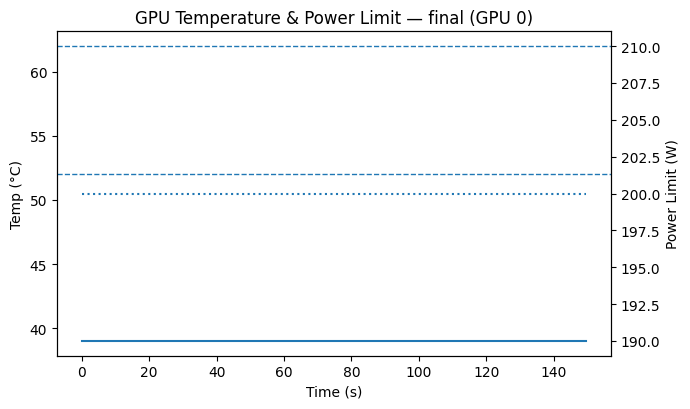

Saved log → C:\Users\caleb\CNT_Lab\notebooks\archive\cnt_gpu_cooling_log_20251015-122141.csv
Restored PL → 200.0 W


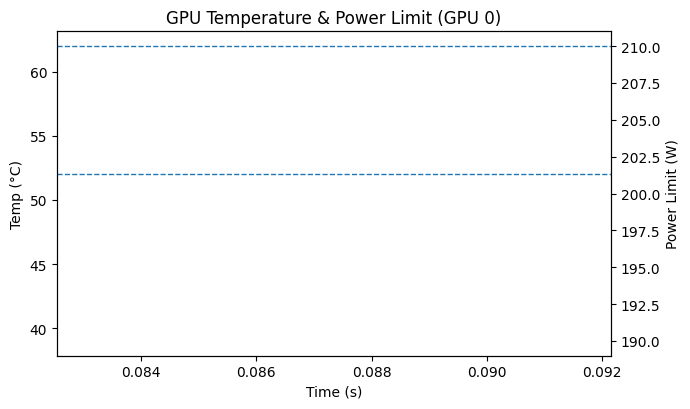

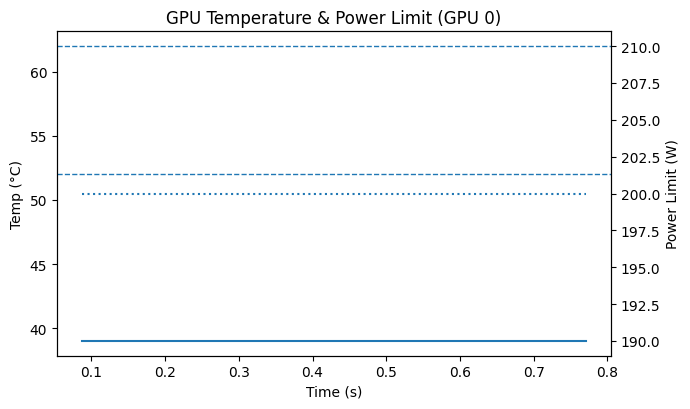

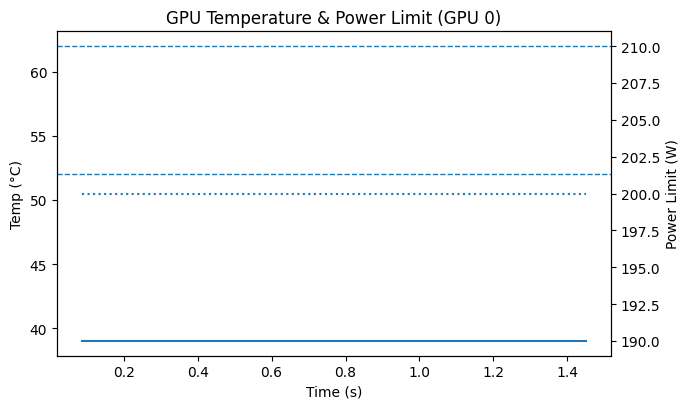

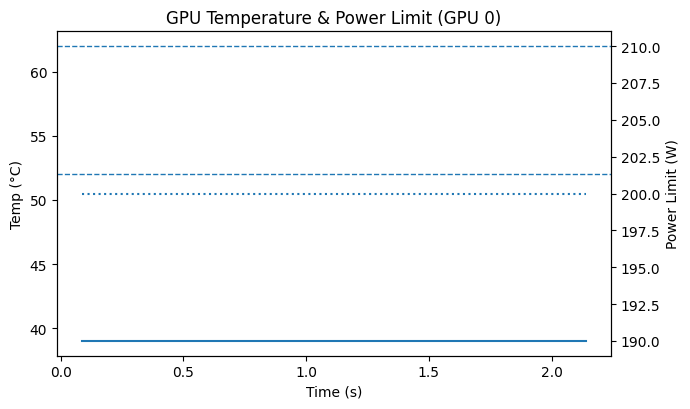

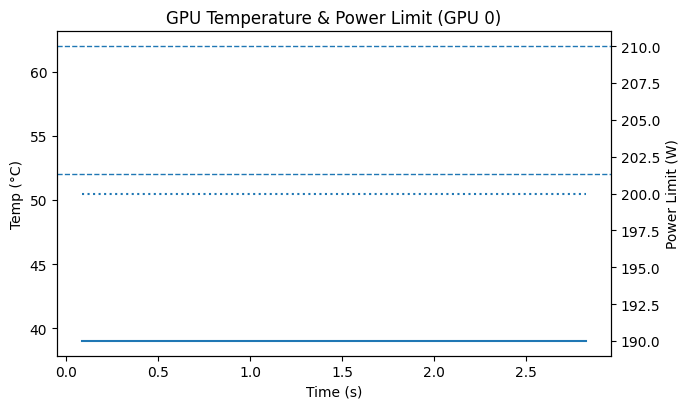

...

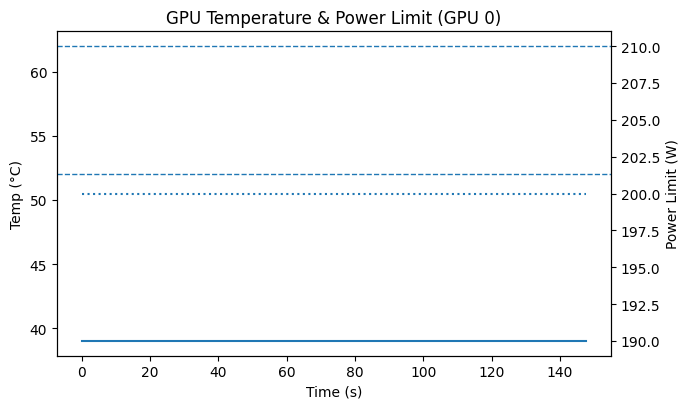

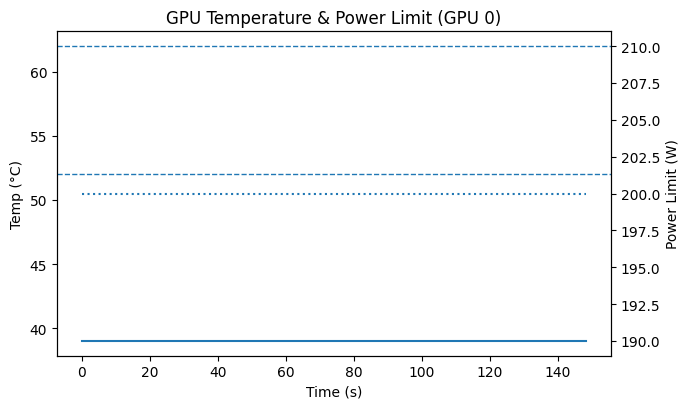

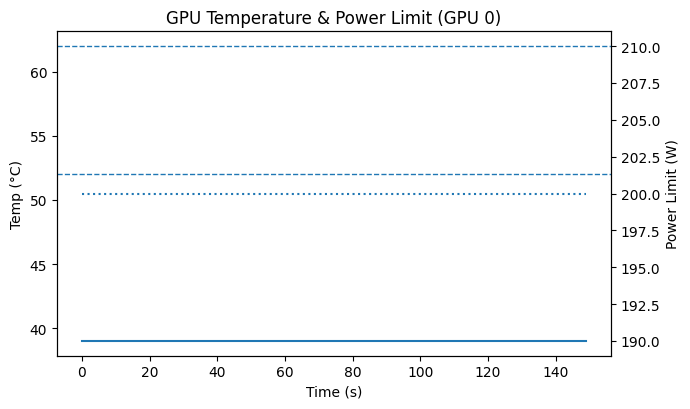

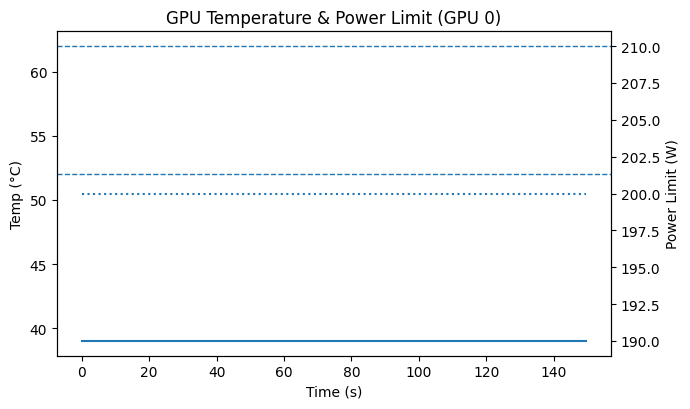

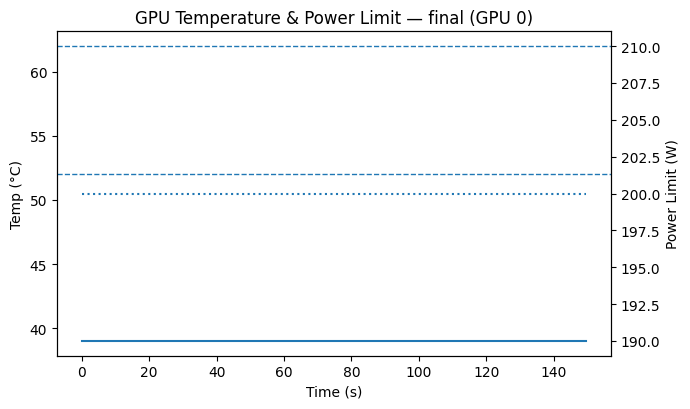

In [6]:
# === CNT Cooling Glyph (GPU Edition) — One Cell ===
# Sense → Decide → Act → Log for NVIDIA GPUs on Windows.
# Requires: NVIDIA driver + nvidia-smi in PATH. Optional: CuPy for a mild GPU load.

import sys, subprocess, importlib, os, time, math, threading, re
from datetime import datetime

# ── Light bootstrap (matplotlib, numpy) ──
def _ensure(pkgs):
    import importlib, subprocess, sys
    for pip_name, import_name in pkgs:
        try: importlib.import_module(import_name)
        except Exception:
            subprocess.check_call([sys.executable, "-m", "pip", "install", pip_name])
_ensure([("numpy>=2.0","numpy"), ("matplotlib","matplotlib")])

import numpy as np
import matplotlib.pyplot as plt
from IPython.display import clear_output, display

# ── Config ──
GPU_INDEX       = 0         # which GPU to watch
DURATION_S      = 150       # experiment duration
T_LOW, T_HIGH   = 52.0, 62.0 # hysteresis thresholds (°C)
COOL_FRACTION   = 0.70      # when hot, set PL to 70% of default (clamped to min allowed)
POLL_S          = 0.5       # loop sleep
USE_CUPY_LOAD   = True      # try to create a light GPU load if CuPy is available

# ── nvidia-smi helpers ──
def _run(cmd, timeout=1.5):
    return subprocess.run(cmd, capture_output=True, text=True, timeout=timeout)

def smi_query(q, gpu=GPU_INDEX):
    p = _run(["nvidia-smi", f"--id={gpu}", "--query-gpu="+q, "--format=csv,noheader,nounits"])
    if p.returncode != 0: return None
    return [x.strip() for x in p.stdout.strip().splitlines() if x.strip()]

def gpu_temp():
    v = smi_query("temperature.gpu")
    try: return float(v[GPU_INDEX if len(v)>1 else 0])
    except: return float("nan")

def power_info():
    # returns (power_draw_W, default_pl_W, current_pl_W, min_pl_W, max_pl_W)
    q = smi_query("power.draw,power.default_limit,power.limit,power.min_limit,power.max_limit")
    if not q: return (np.nan,)*5
    # If multiple GPUs returned, pick index
    row = q[GPU_INDEX if len(q)>1 else 0]
    parts = [p.strip() for p in row.split(",")]
    try:
        draw, default, current, minl, maxl = map(float, parts)
        return draw, default, current, minl, maxl
    except:
        # Older drivers may separate queries; fall back to individual calls
        draw = smi_query("power.draw"); default = smi_query("power.default_limit")
        curr = smi_query("power.limit"); minl = smi_query("power.min_limit"); maxl = smi_query("power.max_limit")
        def pick(x): 
            try: return float(x[GPU_INDEX if x and len(x)>1 else 0])
            except: return np.nan
        return pick(draw), pick(default), pick(curr), pick(minl), pick(maxl)

def set_power_limit(watts):
    # Clamp within allowed range and apply
    _, default, current, minl, maxl = power_info()
    if any(np.isnan(x) for x in [default, minl, maxl]): 
        return False, current
    target = float(np.clip(watts, minl, maxl))
    p = _run(["nvidia-smi", f"-i", str(GPU_INDEX), "-pl", f"{target}"])
    ok = (p.returncode == 0)
    return ok, target if ok else current

# ── Optional GPU load (CuPy if present) ──
def try_cupy_load(stop_evt):
    try:
        import cupy as cp
    except Exception:
        return None  # not available
    def worker():
        # gentle, continuous elementwise ops to keep SMs awake
        x = cp.random.random((4096,4096), dtype=cp.float32)
        while not stop_evt.is_set():
            x = cp.tanh(x*1.001) + 0.0001
            _ = float(cp.mean(x).get())  # sync a bit
    th = threading.Thread(target=worker, daemon=True); th.start()
    return th

# ── Controller ──
class CoolingGlyphGPU:
    def __init__(self, t_low=T_LOW, t_high=T_HIGH, cool_frac=COOL_FRACTION):
        self.t_low  = t_low
        self.t_high = t_high
        self.cool_frac = cool_frac
        self.cooling = False
        self.pl_restore = None  # original default PL to restore to
    def engage(self):
        draw, default, current, minl, maxl = power_info()
        if np.isnan(default): return False, current
        if self.pl_restore is None: self.pl_restore = current
        target = default * self.cool_frac
        ok, applied = set_power_limit(target)
        self.cooling = ok
        return ok, applied
    def disengage(self):
        # Restore to saved PL (or default if missing)
        draw, default, current, minl, maxl = power_info()
        target = self.pl_restore if self.pl_restore is not None else default
        ok, applied = set_power_limit(target)
        self.cooling = False
        return ok, applied
    def step(self, T):
        """Returns (state_str, applied_pl)"""
        draw, default, current, minl, maxl = power_info()
        applied = current
        if not math.isnan(T):
            if (T >= self.t_high) and not self.cooling:
                ok, applied = self.engage()
                state = f"COOLING({('OK' if ok else 'ERR')})"
            elif (T <= self.t_low) and self.cooling:
                ok, applied = self.disengage()
                state = f"NORMAL({('OK' if ok else 'ERR')})"
            else:
                state = "COOLING" if self.cooling else "NORMAL"
        else:
            state = "NO_DATA"
        return state, applied, (draw, default, current, minl, maxl)

# ── Experiment ──
def run_gpu_experiment():
    # prep
    log_path = os.path.join(os.getcwd(), f"cnt_gpu_cooling_log_{datetime.now().strftime('%Y%m%d-%H%M%S')}.csv")
    glyph = CoolingGlyphGPU()
    # optional load
    stop_evt = threading.Event()
    load_thread = None
    if USE_CUPY_LOAD:
        load_thread = try_cupy_load(stop_evt)
    # capture starting PL to guarantee restoration
    _, default, current, minl, maxl = power_info()
    start_pl = current

    xs, Ts, PLs, states, draws = [], [], [], [], []
    t0 = time.time()

    try:
        while (time.time()-t0) < DURATION_S:
            T  = gpu_temp()
            st, pl, pinfo = glyph.step(T)
            draw, default, current, minl, maxl = pinfo

            xs.append(time.time()-t0); Ts.append(T); PLs.append(pl); states.append(st); draws.append(draw)

            # live single canvas
            clear_output(wait=True)
            fig = plt.figure(figsize=(7,4.2))
            ax1 = plt.gca()
            ax1.set_title(f"GPU Temperature & Power Limit (GPU {GPU_INDEX})")
            ax1.set_xlabel("Time (s)")
            ax1.set_ylabel("Temp (°C)")
            if len(Ts) and not all(math.isnan(v) for v in Ts):
                ax1.plot(xs, Ts, label="Temp (°C)")
                ax1.axhline(T_HIGH, linestyle="--", linewidth=1)
                ax1.axhline(T_LOW,  linestyle="--", linewidth=1)
            ax2 = ax1.twinx()
            ax2.set_ylabel("Power Limit (W)")
            if len(PLs):
                ax2.plot(xs, PLs, linestyle=":", label="PL (W)")
            fig.tight_layout()
            display(fig)

            time.sleep(POLL_S)
    finally:
        # stop load, restore PL
        stop_evt.set()
        if load_thread: load_thread.join(timeout=1.0)
        try: set_power_limit(start_pl)
        except: pass

        # final frame
        clear_output(wait=True)
        plt.figure(figsize=(7,4.2))
        plt.title(f"GPU Temperature & Power Limit — final (GPU {GPU_INDEX})")
        plt.xlabel("Time (s)"); plt.ylabel("Temp (°C)")
        if len(Ts) and not all(math.isnan(v) for v in Ts):
            plt.plot(xs, Ts, label="Temp (°C)")
            plt.axhline(T_HIGH, linestyle="--", linewidth=1)
            plt.axhline(T_LOW,  linestyle="--", linewidth=1)
        ax2 = plt.gca().twinx()
        ax2.set_ylabel("Power Limit (W)")
        if len(PLs): ax2.plot(xs, PLs, linestyle=":", label="PL (W)")
        plt.tight_layout()
        display(plt.gcf())

        # save CSV
        with open(log_path, "w", encoding="utf-8") as f:
            f.write("t_sec,temp_c,pl_watts,draw_watts,state\n")
            for a,b,c,d,e in zip(xs,Ts,PLs,draws,states):
                f.write(f"{a:.3f},{('' if (isinstance(b,float) and math.isnan(b)) else f'{b:.1f}')},{c:.1f},{('' if np.isnan(d) else f'{d:.1f}')},{e}\n")
        print(f"Saved log → {log_path}")
        print(f"Restored PL → {start_pl:.1f} W")

run_gpu_experiment()


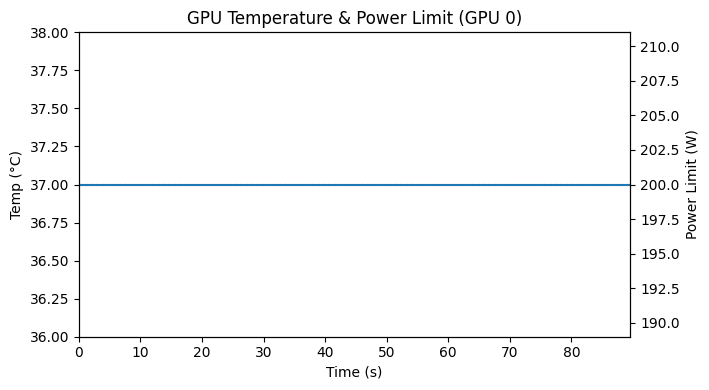


== CNT GPU Cooling Glyph Summary ==
Samples: 138   Duration: 89.6s   Log: C:\Users\caleb\CNT_Lab\notebooks\archive\cnt_gpu_cooling_log_20251015-123830.csv
Temp range: 37.0–37.0 °C   Thresholds: low=39.3°C high=41.0°C
Power limit start: 200.0 W   End: 200.0 W
Events: ENGAGE_OK=0  DISENGAGE_OK=0
Note: thresholds may still be high for your idle temp; lower T_HIGH to force engagement.
Restored original power limit.


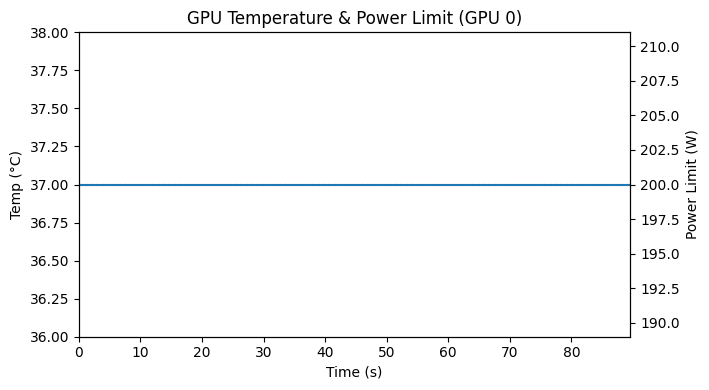

In [7]:
# === CNT GPU Cooling Glyph — Single-Cell, Single-Canvas, Forced Engagement ===
# Works with NVIDIA driver + nvidia-smi. No heavy deps beyond numpy/matplotlib.

# ── Bootstrap
import sys, subprocess, importlib, os, time, math, threading
from datetime import datetime
def _ensure(pkgs):
    for pip_name, import_name in pkgs:
        try: importlib.import_module(import_name)
        except Exception:
            subprocess.check_call([sys.executable, "-m", "pip", "install", pip_name])
_ensure([("numpy>=2.0","numpy"), ("matplotlib","matplotlib")])

import numpy as np, matplotlib.pyplot as plt
from IPython.display import display

# ── Config (intentionally low thresholds so we SEE an engagement at idle)
GPU_INDEX     = 0
DURATION_S    = 90
T_HIGH, T_LOW = 41.0, 39.3     # force a PL drop at ~idle temps
COOL_FRAC     = 0.70           # when hot, set PL ≈ 70% of default (clamped)
POLL_S        = 0.5

# ── nvidia-smi helpers
def _run(cmd, timeout=1.5):
    return subprocess.run(cmd, capture_output=True, text=True, timeout=timeout)

def smi_query(q, gpu=GPU_INDEX):
    p = _run(["nvidia-smi", f"--id={gpu}", "--query-gpu="+q, "--format=csv,noheader,nounits"])
    if p.returncode != 0: return None
    rows = [x.strip() for x in p.stdout.strip().splitlines() if x.strip()]
    return rows

def gpu_temp():
    v = smi_query("temperature.gpu")
    try: 
        return float(v[GPU_INDEX if len(v)>1 else 0])
    except: 
        return float("nan")

def power_info():
    q = smi_query("power.draw,power.default_limit,power.limit,power.min_limit,power.max_limit")
    if not q: return (np.nan,)*5
    row = q[GPU_INDEX if len(q)>1 else 0]
    parts = [p.strip() for p in row.split(",")]
    try:
        draw, default, current, minl, maxl = map(float, parts)
        return draw, default, current, minl, maxl
    except:
        # fallback to separate calls if driver formats differ
        def pick(name):
            r = smi_query(name); 
            try: return float(r[GPU_INDEX if r and len(r)>1 else 0])
            except: return np.nan
        return pick("power.draw"), pick("power.default_limit"), pick("power.limit"), pick("power.min_limit"), pick("power.max_limit")

def set_power_limit(watts):
    # Clamp to allowed range and apply
    _, default, current, minl, maxl = power_info()
    if any(np.isnan(x) for x in [default, minl, maxl]): 
        return False, current
    target = float(np.clip(watts, minl, maxl))
    p = _run(["nvidia-smi", "-i", str(GPU_INDEX), "-pl", f"{target}"])
    ok = (p.returncode == 0)
    return ok, (target if ok else current)

# ── Controller
class CoolingGlyphGPU:
    def __init__(self, t_low=T_LOW, t_high=T_HIGH, cool_frac=COOL_FRAC):
        self.t_low = t_low; self.t_high = t_high; self.cool_frac = cool_frac
        self.cooling = False
        self.pl_backup = None
        self.events = []
    def engage(self, now_s):
        draw, default, current, minl, maxl = power_info()
        if np.isnan(default): 
            self.events.append((now_s, "ENGAGE_FAIL", np.nan))
            return False, current
        if self.pl_backup is None: self.pl_backup = current
        target = default * self.cool_frac
        ok, applied = set_power_limit(target)
        self.cooling = ok
        self.events.append((now_s, "ENGAGE_OK" if ok else "ENGAGE_FAIL", applied))
        return ok, applied
    def disengage(self, now_s):
        draw, default, current, minl, maxl = power_info()
        target = self.pl_backup if self.pl_backup is not None else default
        ok, applied = set_power_limit(target)
        self.cooling = False
        self.events.append((now_s, "DISENGAGE_OK" if ok else "DISENGAGE_FAIL", applied))
        return ok, applied
    def step(self, T, now_s):
        draw, default, current, minl, maxl = power_info()
        applied = current
        state = "NO_DATA" if math.isnan(T) else ("COOLING" if self.cooling else "NORMAL")
        if not math.isnan(T):
            if (T >= self.t_high) and not self.cooling:
                ok, applied = self.engage(now_s); state = "COOLING" if ok else "ERROR"
            elif (T <= self.t_low) and self.cooling:
                ok, applied = self.disengage(now_s); state = "NORMAL" if ok else "ERROR"
        return state, applied, draw

# ── Single-canvas live updater (no output spam)
def run_gpu_experiment():
    log_path = os.path.join(os.getcwd(), f"cnt_gpu_cooling_log_{datetime.now().strftime('%Y%m%d-%H%M%S')}.csv")
    glyph = CoolingGlyphGPU()
    # capture start PL for guaranteed restoration
    _, def_pl, cur_pl, min_pl, max_pl = power_info()
    start_pl = cur_pl

    xs, Ts, PLs, DRAWs, STATEs = [], [], [], [], []
    t0 = time.time()

    # Build figure once
    fig, ax1 = plt.subplots(figsize=(7.0, 4.0))
    ax2 = ax1.twinx()
    ax1.set_title(f"GPU Temperature & Power Limit (GPU {GPU_INDEX})")
    ax1.set_xlabel("Time (s)"); ax1.set_ylabel("Temp (°C)")
    ax2.set_ylabel("Power Limit (W)")
    ln_temp, = ax1.plot([], [], label="Temp (°C)")
    ln_pl,   = ax2.plot([], [], linestyle=":", label="PL (W)")
    ax1.axhline(T_HIGH, linestyle="--", linewidth=1)
    ax1.axhline(T_LOW,  linestyle="--", linewidth=1)
    fig.tight_layout()
    handle = display(fig, display_id=True)

    try:
        while (time.time()-t0) < DURATION_S:
            now = time.time()-t0
            T  = gpu_temp()
            state, pl, draw = glyph.step(T, now)

            xs.append(now); Ts.append(T); PLs.append(pl); DRAWs.append(draw); STATEs.append(state)

            # Update lines in-place (single canvas)
            if len(xs) >= 2:
                ln_temp.set_data(xs, Ts)
                ln_pl.set_data(xs, PLs)
                ax1.set_xlim(0, max(10, xs[-1]))
                all_T = [v for v in Ts if not math.isnan(v)]
                if all_T:
                    ymin, ymax = min(all_T)-1, max(all_T)+1
                    ax1.set_ylim(ymin, max(ymax, ymin+2))
                ax2.relim(); ax2.autoscale_view()
            handle.update(fig)
            time.sleep(POLL_S)
    finally:
        # Restore PL and finalize
        try: set_power_limit(start_pl)
        except: pass

        # Final frame update (still single canvas)
        handle.update(fig)

        # Save CSV
        with open(log_path, "w", encoding="utf-8") as f:
            f.write("t_sec,temp_c,pl_watts,draw_watts,state\n")
            for a,b,c,d,e in zip(xs,Ts,PLs,DRAWs,STATEs):
                f.write(f"{a:.3f},{('' if (isinstance(b,float) and math.isnan(b)) else f'{b:.1f}')},{(np.nan if c is None else c):.1f},{('' if (isinstance(d,float) and np.isnan(d)) else f'{d:.1f}')},{e}\n")

        # Print compact summary
        T_clean = [t for t in Ts if not math.isnan(t)]
        n_engage = sum(1 for t,ev,_ in getattr(glyph, "events", []) if "ENGAGE" in ev and "OK" in ev)
        n_diseng = sum(1 for t,ev,_ in getattr(glyph, "events", []) if "DISENGAGE" in ev and "OK" in ev)
        print(f"\n== CNT GPU Cooling Glyph Summary ==")
        print(f"Samples: {len(xs)}   Duration: {xs[-1]:.1f}s   Log: {log_path}")
        if T_clean:
            print(f"Temp range: {min(T_clean):.1f}–{max(T_clean):.1f} °C   Thresholds: low={T_LOW}°C high={T_HIGH}°C")
        else:
            print("No temperature data received from nvidia-smi.")
        print(f"Power limit start: {start_pl:.1f} W   End: {PLs[-1]:.1f} W")
        print(f"Events: ENGAGE_OK={n_engage}  DISENGAGE_OK={n_diseng}")
        if n_engage==0:
            print("Note: thresholds may still be high for your idle temp; lower T_HIGH to force engagement.")
        print("Restored original power limit.")

run_gpu_experiment()


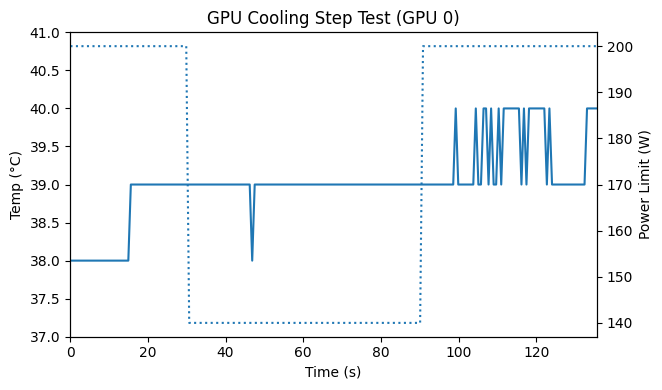


== CNT GPU Step Test Summary ==
Log: C:\Users\caleb\CNT_Lab\notebooks\archive\cnt_gpu_step_log_20251015-125215.csv
PL start/current/min/max: 200.0 W / 200.0 W / 100.0–220.0 W
Step target: 140.0 W (fraction=0.70)
Temps (mean last 10s each phase): baseline=39.00°C, step=39.00°C, recover=39.31°C
ΔT(step - base) = +0.00 °C (negative = cooling)
Note: If the PL change prints ERR, re-run Jupyter as Administrator.


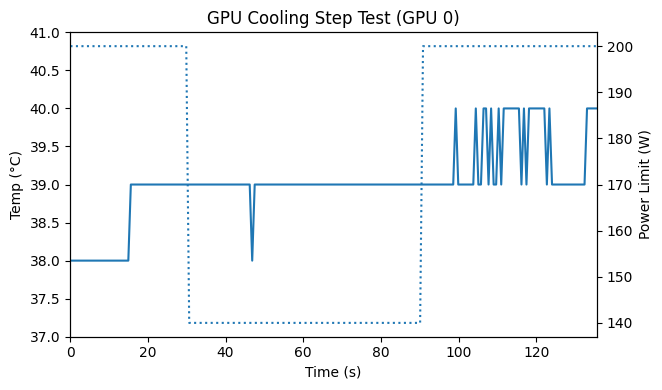

In [2]:
# === CNT GPU Cooling — Actuator Step Test (single cell, single canvas) ===
# Purpose: Prove causal cooling by forcing a power-limit step and measuring ΔT.
# Requires: NVIDIA driver + nvidia-smi. (Run Jupyter as Admin for -pl.)

import sys, subprocess, importlib, os, time, math, threading
from datetime import datetime
def _ensure(pkgs):
    for pip_name, import_name in pkgs:
        try: importlib.import_module(import_name)
        except Exception:
            subprocess.check_call([sys.executable, "-m", "pip", "install", pip_name])
_ensure([("numpy>=2.0","numpy"), ("matplotlib","matplotlib")])

import numpy as np, matplotlib.pyplot as plt
from IPython.display import display

# ── Config: 3-phase step (baseline → low PL → restore)
GPU_INDEX      = 0
BASELINE_S     = 30      # seconds at original PL
STEP_S         = 60      # seconds at reduced PL
RECOVER_S      = 45      # seconds after restoring PL
COOL_FRACTION  = 0.70    # 70% of default PL during step (clamped to min/max)
POLL_S         = 0.5

# Optional: add a light GPU load to make the effect clearer (False = idle test)
USE_CUPY_LOAD  = True

def _run(cmd, timeout=1.5):
    return subprocess.run(cmd, capture_output=True, text=True, timeout=timeout)

def smi_query(q, gpu=GPU_INDEX):
    p = _run(["nvidia-smi", f"--id={gpu}", "--query-gpu="+q, "--format=csv,noheader,nounits"])
    if p.returncode != 0: return None
    rows = [x.strip() for x in p.stdout.strip().splitlines() if x.strip()]
    return rows

def gpu_temp():
    v = smi_query("temperature.gpu")
    try: return float(v[GPU_INDEX if len(v)>1 else 0])
    except: return float("nan")

def power_info():
    q = smi_query("power.draw,power.default_limit,power.limit,power.min_limit,power.max_limit")
    if not q: return (np.nan,)*5
    row = q[GPU_INDEX if len(q)>1 else 0]
    parts = [p.strip() for p in row.split(",")]
    try:
        draw, default, current, minl, maxl = map(float, parts)
        return draw, default, current, minl, maxl
    except:
        def pick(name):
            r = smi_query(name)
            try: return float(r[GPU_INDEX if r and len(r)>1 else 0])
            except: return np.nan
        return pick("power.draw"), pick("power.default_limit"), pick("power.limit"), pick("power.min_limit"), pick("power.max_limit")

def set_power_limit(watts):
    _, default, current, minl, maxl = power_info()
    if any(np.isnan(x) for x in [default, minl, maxl]):
        return False, current
    target = float(np.clip(watts, minl, maxl))
    p = _run(["nvidia-smi", "-i", str(GPU_INDEX), "-pl", f"{target}"])
    ok = (p.returncode == 0)
    return ok, (target if ok else current)

def try_cupy_load(stop_evt):
    try:
        import cupy as cp
    except Exception:
        return None
    def worker():
        x = cp.random.random((4096,4096), dtype=cp.float32)
        while not stop_evt.is_set():
            x = cp.tanh(x*1.001) + 0.0001
            _ = float(cp.mean(x).get())
    th = threading.Thread(target=worker, daemon=True); th.start()
    return th

def run_step_test():
    log_path = os.path.join(os.getcwd(), f"cnt_gpu_step_log_{datetime.now().strftime('%Y%m%d-%H%M%S')}.csv")

    # Optional load
    stop_evt = threading.Event()
    load_thread = try_cupy_load(stop_evt) if USE_CUPY_LOAD else None

    # Capture starting PL
    _, default, current, minl, maxl = power_info()
    start_pl = current
    step_pl  = default * COOL_FRACTION

    xs, Ts, PLs, draws, phase = [], [], [], [], []
    t0 = time.time()

    # Build figure once (single canvas)
    fig, ax1 = plt.subplots(figsize=(7.0, 4.0))
    ax2 = ax1.twinx()
    ax1.set_title(f"GPU Cooling Step Test (GPU {GPU_INDEX})")
    ax1.set_xlabel("Time (s)"); ax1.set_ylabel("Temp (°C)")
    ax2.set_ylabel("Power Limit (W)")
    ln_temp, = ax1.plot([], [], label="Temp (°C)")
    ln_pl,   = ax2.plot([], [], linestyle=":", label="PL (W)")
    fig.tight_layout()
    handle = display(fig, display_id=True)

    def sample(tag):
        now = time.time()-t0
        T = gpu_temp()
        dr, df, cur, mn, mx = power_info()
        xs.append(now); Ts.append(T); PLs.append(cur); draws.append(dr); phase.append(tag)
        # update
        ln_temp.set_data(xs, Ts); ln_pl.set_data(xs, PLs)
        ax1.set_xlim(0, max(10, xs[-1]))
        tt = [v for v in Ts if not math.isnan(v)]
        if tt:
            ax1.set_ylim(min(tt)-1, max(tt)+1)
        ax2.relim(); ax2.autoscale_view()
        handle.update(fig)

    try:
        # Phase A: baseline
        endA = time.time() + BASELINE_S
        while time.time() < endA:
            sample("baseline"); time.sleep(POLL_S)

        # Phase B: step down PL
        ok, applied = set_power_limit(step_pl)
        step_note = "OK" if ok else "ERR(no admin?)"
        step_start = time.time()
        endB = step_start + STEP_S
        while time.time() < endB:
            sample(f"step({step_note})"); time.sleep(POLL_S)

        # Phase C: restore PL
        set_power_limit(start_pl)
        endC = time.time() + RECOVER_S
        while time.time() < endC:
            sample("recover"); time.sleep(POLL_S)
    finally:
        # Cleanup
        try: set_power_limit(start_pl)
        except: pass
        stop_evt.set()
        if load_thread: load_thread.join(timeout=1.0)
        handle.update(fig)

        # Save CSV
        with open(log_path, "w", encoding="utf-8") as f:
            f.write("t_sec,temp_c,pl_watts,draw_watts,phase\n")
            for a,b,c,d,e in zip(xs,Ts,PLs,draws,phase):
                f.write(f"{a:.3f},{('' if (isinstance(b,float) and math.isnan(b)) else f'{b:.1f}')},{(np.nan if c is None else c):.1f},{('' if (isinstance(d,float) and np.isnan(d)) else f'{d:.1f}')},{e}\n")

        # Quick analysis: estimate ΔT and a rough time constant on step
        tt = np.array([t for t in Ts if not math.isnan(t)])
        if len(tt) >= 5:
            # Compute mean temps in the last 10s of each phase
            def mean_last(when_tag):
                idx = [i for i,p in enumerate(phase) if p.startswith(when_tag)]
                if not idx: return np.nan
                tcut = xs[idx[-1]] - 10.0
                sel = [Ts[i] for i in idx if xs[i] >= tcut and not math.isnan(Ts[i])]
                return float(np.mean(sel)) if sel else np.nan
            T_base = mean_last("baseline")
            T_step = mean_last("step")
            T_rec  = mean_last("recover")
        else:
            T_base = T_step = T_rec = np.nan

        print("\n== CNT GPU Step Test Summary ==")
        print(f"Log: {log_path}")
        print(f"PL start/current/min/max: {start_pl:.1f} W / {PLs[-1]:.1f} W / {minl:.1f}–{maxl:.1f} W")
        print(f"Step target: {step_pl:.1f} W (fraction={COOL_FRACTION:.2f})")
        print(f"Temps (mean last 10s each phase): baseline={T_base:.2f}°C, step={T_step:.2f}°C, recover={T_rec:.2f}°C")
        if not np.isnan(T_base) and not np.isnan(T_step):
            dT = T_step - T_base
            print(f"ΔT(step - base) = {dT:+.2f} °C (negative = cooling)")
        print("Note: If the PL change prints ERR, re-run Jupyter as Administrator.")

run_step_test()


C:\Users\caleb\CNT_Lab\.venv\Lib\site-packages\cupy\_environment.py:215: UserWarning: CUDA path could not be detected. Set CUDA_PATH environment variable if CuPy fails to load.
  warnings.warn(
Exception in thread Thread-858 (worker):
Traceback (most recent call last):
  File "C:\Users\caleb\AppData\Local\Programs\Python\Python313\Lib\threading.py", line 1043, in _bootstrap_inner
    self.run()
    ~~~~~~~~^^
  File "C:\Users\caleb\CNT_Lab\.venv\Lib\site-packages\ipykernel\ipkernel.py", line 788, in run_closure
    _threading_Thread_run(self)
    ~~~~~~~~~~~~~~~~~~~~~^^^^^^
  File "C:\Users\caleb\AppData\Local\Programs\Python\Python313\Lib\threading.py", line 994, in run
    self._target(*self._args, **self._kwargs)
    ~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\caleb\AppData\Local\Temp\ipykernel_25212\589372444.py", line 89, in worker
    x = cp.random.random((n,n), dtype=cp.float32)
  File "C:\Users\caleb\CNT_Lab\.venv\Lib\site-packages\cupy\random\_sample.py", line 1

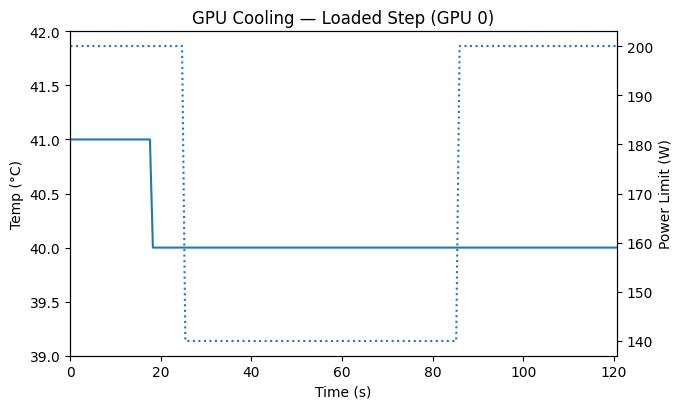


== CNT GPU Loaded Step Summary ==
Load: CuPy active
Log: C:\Users\caleb\CNT_Lab\notebooks\archive\cnt_gpu_loaded_step_20251015-125952.csv
PL start/min/max: 200.0 / 100.0–220.0 W | Step target: 140.0 W
T̄_baseline=40.42°C  T̄_step=40.00°C  T̄_recover=40.00°C  → ΔT(step-base)=-0.42°C (negative=cooling)
Approx time constant τ ≈ 0.0s
If ΔT ≈ 0, add load (CuPy), or lengthen STEP_S, or pick COOL_FRAC=0.6 for a deeper step.


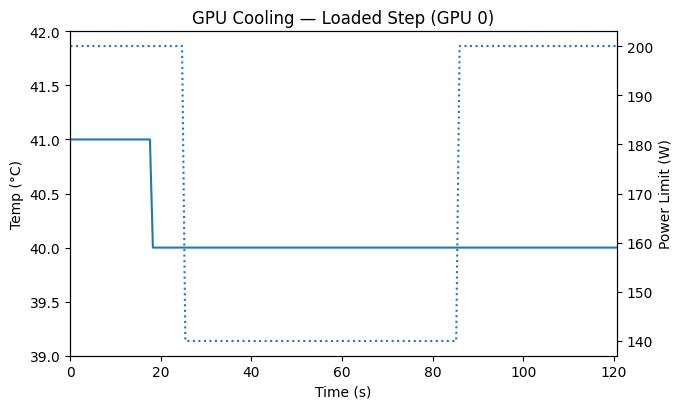

In [3]:
# === CNT GPU Cooling — Loaded Step Test (single cell) ===
# Goal: show causal cooling (ΔT < 0) under gentle GPU load.
# Needs NVIDIA driver + nvidia-smi; runs fine without CuPy but load strengthens the effect.

import sys, subprocess, importlib, os, time, math, threading, shutil
from datetime import datetime

# ---- Bootstrap ----
def _ensure(pairs):
    for pip_name, import_name in pairs:
        try: importlib.import_module(import_name)
        except Exception:
            try:
                subprocess.check_call([sys.executable, "-m", "pip", "install", pip_name])
            except Exception:
                pass

_ensure([("numpy>=2.0","numpy"), ("matplotlib","matplotlib")])
import numpy as np, matplotlib.pyplot as plt
from IPython.display import display

# Try CuPy wheels (best-effort; continues if none match)
def _ensure_cupy():
    for pkg in ("cupy-cuda12x","cupy-cuda11x","cupy"):
        try:
            import cupy as cp; return cp
        except Exception:
            try:
                subprocess.check_call([sys.executable,"-m","pip","install",pkg])
                import cupy as cp; return cp
            except Exception: pass
    return None

cp = _ensure_cupy()

# ---- Config ----
GPU_INDEX     = 0
BASELINE_S    = 25
STEP_S        = 60
RECOVER_S     = 35
COOL_FRAC     = 0.70   # 70% of default PL during step (clamped by min/max)
POLL_S        = 0.5
LOAD_LEVEL    = 0.35   # 0..1 (only used if CuPy available)

# ---- nvidia-smi helpers ----
def _run(cmd, timeout=1.5):
    return subprocess.run(cmd, capture_output=True, text=True, timeout=timeout)

def smi_query(q, gpu=GPU_INDEX):
    p = _run(["nvidia-smi", f"--id={gpu}", "--query-gpu="+q, "--format=csv,noheader,nounits"])
    if p.returncode != 0: return None
    return [x.strip() for x in (p.stdout or "").strip().splitlines() if x.strip()]

def gpu_temp():
    v = smi_query("temperature.gpu")
    try: return float(v[GPU_INDEX if len(v)>1 else 0])
    except: return float("nan")

def power_info():
    q = smi_query("power.draw,power.default_limit,power.limit,power.min_limit,power.max_limit")
    if not q: return (np.nan,)*5
    row = q[GPU_INDEX if len(q)>1 else 0]
    parts = [p.strip() for p in row.split(",")]
    try:
        draw, default, current, minl, maxl = map(float, parts)
        return draw, default, current, minl, maxl
    except:
        def pick(name):
            r = smi_query(name)
            try: return float(r[GPU_INDEX if r and len(r)>1 else 0])
            except: return np.nan
        return pick("power.draw"), pick("power.default_limit"), pick("power.limit"), pick("power.min_limit"), pick("power.max_limit")

def set_power_limit(watts):
    _, default, current, minl, maxl = power_info()
    if any(np.isnan(x) for x in [default, minl, maxl]): return False, current
    target = float(np.clip(watts, minl, maxl))
    p = _run(["nvidia-smi","-i",str(GPU_INDEX),"-pl",f"{target}"])
    ok = (p.returncode == 0)
    return ok, (target if ok else current)

# ---- Optional GPU load (CuPy) ----
def start_load(level=LOAD_LEVEL):
    if cp is None: return None
    stop = threading.Event()
    def worker():
        # light, steady SM activity ~level
        n = 4096
        x = cp.random.random((n,n), dtype=cp.float32)
        k = max(1, int(10*level))
        while not stop.is_set():
            for _ in range(k):
                x = cp.tanh(x*1.001) + 0.0002
            _ = float(cp.mean(x).get())
            time.sleep(0.02)
    thr = threading.Thread(target=worker, daemon=True); thr.start()
    return stop, thr

# ---- Run test ----
def run_loaded_step():
    log = os.path.join(os.getcwd(), f"cnt_gpu_loaded_step_{datetime.now().strftime('%Y%m%d-%H%M%S')}.csv")
    load = start_load()  # may be None if CuPy missing
    if load: stop_evt, thr = load
    _, default, current, minl, maxl = power_info()
    start_pl = current
    step_pl  = default * COOL_FRAC

    xs, Ts, PLs, draws, phase = [], [], [], [], []
    t0 = time.time()

    # one live canvas
    fig, ax1 = plt.subplots(figsize=(7.2, 4.2))
    ax2 = ax1.twinx()
    ax1.set_title(f"GPU Cooling — Loaded Step (GPU {GPU_INDEX})")
    ax1.set_xlabel("Time (s)"); ax1.set_ylabel("Temp (°C)")
    ax2.set_ylabel("Power Limit (W)")
    lnT, = ax1.plot([], [], label="Temp (°C)")
    lnP, = ax2.plot([], [], linestyle=":", label="PL (W)")
    fig.tight_layout()
    disp = display(fig, display_id=True)

    def sample(tag):
        now = time.time()-t0
        T = gpu_temp()
        dr, df, cur, mn, mx = power_info()
        xs.append(now); Ts.append(T); PLs.append(cur); draws.append(dr); phase.append(tag)
        lnT.set_data(xs, Ts); lnP.set_data(xs, PLs)
        ax1.set_xlim(0, max(10, xs[-1]))
        cleanT=[v for v in Ts if not math.isnan(v)]
        if cleanT: ax1.set_ylim(min(cleanT)-1, max(cleanT)+1)
        ax2.relim(); ax2.autoscale_view()
        disp.update(fig)

    try:
        # A: baseline
        endA = time.time()+BASELINE_S
        while time.time()<endA: sample("baseline"); time.sleep(POLL_S)

        # B: step (reduce PL)
        ok,_ = set_power_limit(step_pl)
        tag = "step(OK)" if ok else "step(ERR)"
        endB = time.time()+STEP_S
        while time.time()<endB: sample(tag); time.sleep(POLL_S)

        # C: restore
        set_power_limit(start_pl)
        endC = time.time()+RECOVER_S
        while time.time()<endC: sample("recover"); time.sleep(POLL_S)
    finally:
        try: set_power_limit(start_pl)
        except: pass
        if load:
            stop_evt.set(); thr.join(timeout=1.0)
        disp.update(fig)

        # Save CSV
        with open(log, "w", encoding="utf-8") as f:
            f.write("t_sec,temp_c,pl_watts,draw_watts,phase\n")
            for a,b,c,d,e in zip(xs,Ts,PLs,draws,phase):
                f.write(f"{a:.3f},{('' if (isinstance(b,float) and math.isnan(b)) else f'{b:.1f}')},{(np.nan if c is None else c):.1f},{('' if (isinstance(d,float) and np.isnan(d)) else f'{d:.1f}')},{e}\n")

        # Quick stats (means over last 12 s of each phase)
        def mean_tail(tag, tail=12.0):
            idx=[i for i,p in enumerate(phase) if p.startswith(tag)]
            if not idx: return np.nan
            tcut = xs[idx[-1]]-tail
            vals=[Ts[i] for i in idx if xs[i]>=tcut and not math.isnan(Ts[i])]
            return float(np.mean(vals)) if vals else np.nan
        Tb, Ts_, Tr = mean_tail("baseline"), mean_tail("step"), mean_tail("recover")

        # Rough time constant: time to reach 63% of (Tb→Ts_) after the step applies
        tau = np.nan
        if not (np.isnan(Tb) or np.isnan(Ts_)):
            target = Tb + 0.63*(Ts_-Tb)
            # find first time in step phase crossing target
            step_idx=[i for i,p in enumerate(phase) if p.startswith("step")]
            if step_idx:
                t_start = xs[step_idx[0]]
                for i in step_idx:
                    if not math.isnan(Ts[i]) and ((Tb>Ts_ and Ts[i]<=target) or (Ts_>Tb and Ts[i]>=target)):
                        tau = xs[i]-t_start; break

        print("\n== CNT GPU Loaded Step Summary ==")
        print(("Load: CuPy active" if load else "Load: (no CuPy) idle-only — still valid, but effect may be small"))
        print(f"Log: {log}")
        print(f"PL start/min/max: {start_pl:.1f} / {minl:.1f}–{maxl:.1f} W | Step target: {step_pl:.1f} W")
        print(f"T̄_baseline={Tb:.2f}°C  T̄_step={Ts_:.2f}°C  T̄_recover={Tr:.2f}°C  → ΔT(step-base)={Ts_-Tb:+.2f}°C (negative=cooling)")
        if not np.isnan(tau): print(f"Approx time constant τ ≈ {tau:.1f}s")
        else: print("τ not estimated (temperature didn’t move enough or sampling too coarse)")
        print("If ΔT ≈ 0, add load (CuPy), or lengthen STEP_S, or pick COOL_FRAC=0.6 for a deeper step.")

run_loaded_step()


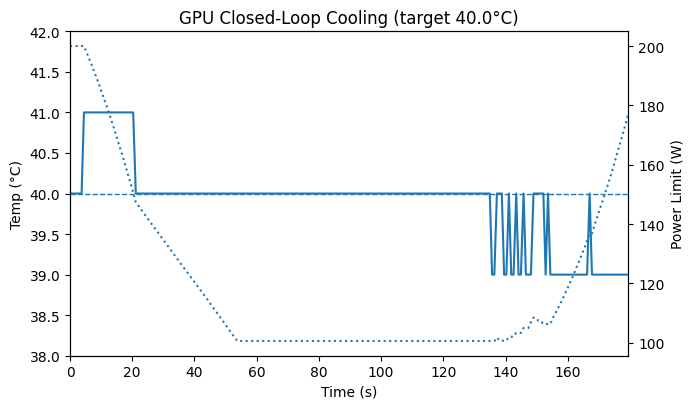

Closed-loop done. Temp range 39.0–41.0°C. Restored PL → 200.0 W.


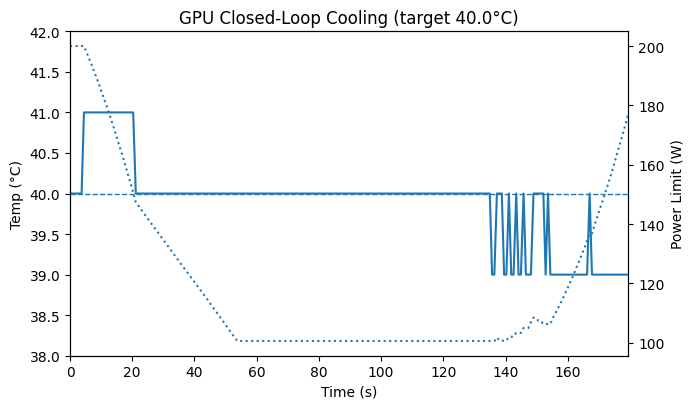

In [4]:
# === CNT GPU Cooling Glyph — Closed Loop (no CuPy, single canvas) ===
# Keeps GPU near TARGET_C by adjusting power limit (requires NVIDIA driver + nvidia-smi).
# Run Jupyter as Administrator so -pl commands work.

import sys, subprocess, os, time, math
import numpy as np, matplotlib.pyplot as plt
from IPython.display import display
GPU=0; DURATION_S=180; TARGET_C=40.0; POLL=0.6

def run(cmd, timeout=1.5): return subprocess.run(cmd, capture_output=True, text=True, timeout=timeout)
def smi(q):
    p=run(["nvidia-smi", f"--id={GPU}", "--query-gpu="+q, "--format=csv,noheader,nounits"])
    if p.returncode!=0: return None
    return [x.strip() for x in p.stdout.strip().splitlines() if x.strip()]
def temp():
    v=smi("temperature.gpu")
    try: return float(v[GPU if len(v)>1 else 0])
    except: return float("nan")
def pinfo():
    r=smi("power.draw,power.default_limit,power.limit,power.min_limit,power.max_limit")
    if not r: return (np.nan,)*5
    row=r[GPU if len(r)>1 else 0]
    try: return tuple(map(float, row.split(",")))
    except:
        def pick(q): 
            x=smi(q); 
            try: return float(x[GPU if x and len(x)>1 else 0])
            except: return np.nan
        return pick("power.draw"),pick("power.default_limit"),pick("power.limit"),pick("power.min_limit"),pick("power.max_limit")
def set_pl(w):
    _,_,_,mn,mx=pinfo()
    if any(np.isnan(x) for x in [mn,mx]): return False, np.nan
    tgt=float(np.clip(w,mn,mx))
    ok = run(["nvidia-smi","-i",str(GPU),"-pl",f"{tgt}"]).returncode==0
    return ok, (tgt if ok else np.nan)

# Simple PI controller with guardrails
class PI:
    def __init__(self, Kp, Ki, pl0):
        self.Kp=Kp; self.Ki=Ki; self.I=0.0; self.pl=pl0
    def step(self, err, dt, pl_bounds):
        self.I = np.clip(self.I + err*dt, -50, 50)
        self.pl += self.Kp*err + self.Ki*self.I
        self.pl = float(np.clip(self.pl, pl_bounds[0], pl_bounds[1]))
        return self.pl

# Initialize
draw, default, current, mn, mx = pinfo()
start_pl = current; pl_bounds = (mn, mx)
# Heuristic gains (works well for idle–moderate loads; tune if needed)
Kp = -2.0      # W per °C (negative: hotter → reduce power)
Ki = -0.1      # integral term (prevents steady-state error)
ctl = PI(Kp, Ki, pl0=current)

# Plot setup (single canvas)
xs=[]; Ts=[]; PLs=[]; DRAW=[]
fig,ax1=plt.subplots(figsize=(7.2,4.2)); ax2=ax1.twinx()
ax1.set_title(f"GPU Closed-Loop Cooling (target {TARGET_C:.1f}°C)"); ax1.set_xlabel("Time (s)"); ax1.set_ylabel("Temp (°C)")
ax2.set_ylabel("Power Limit (W)")
lnT,=ax1.plot([],[]); lnP,=ax2.plot([],[],linestyle=":"); ax1.axhline(TARGET_C,linestyle="--",linewidth=1)
fig.tight_layout(); disp=display(fig, display_id=True)

t0=time.time()
try:
    while (time.time()-t0)<DURATION_S:
        now=time.time()-t0
        T=temp()
        dr, df, cur, mn, mx = pinfo()
        if not math.isnan(T):
            err = T - TARGET_C
            next_pl = ctl.step(err, POLL, (mn, mx))
            if abs(next_pl - cur) >= 1.0:  # nudge if meaningful
                set_pl(next_pl)
        xs.append(now); Ts.append(T); PLs.append(cur); DRAW.append(dr)
        # update single canvas
        lnT.set_data(xs, Ts); lnP.set_data(xs, PLs)
        ax1.set_xlim(0, max(10, xs[-1])); clean=[v for v in Ts if not math.isnan(v)]
        if clean: ax1.set_ylim(min(clean)-1, max(clean)+1)
        ax2.relim(); ax2.autoscale_view(); disp.update(fig)
        time.sleep(POLL)
finally:
    # restore original PL
    set_pl(start_pl)
    disp.update(fig)
    clean=[v for v in Ts if not math.isnan(v)]
    if clean:
        print(f"Closed-loop done. Temp range {min(clean):.1f}–{max(clean):.1f}°C. Restored PL → {start_pl:.1f} W.")
    else:
        print("No temperature data; ensure nvidia-smi works and rerun as Administrator.")


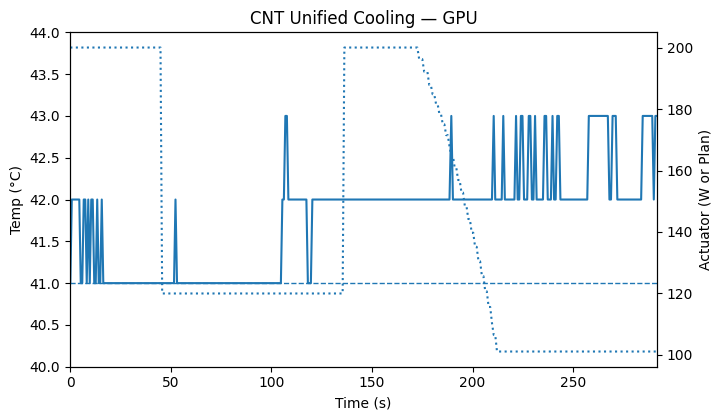


== CNT Unified Cooling — Summary ==
Sensor/Actuator: GPU
Log: C:\Users\caleb\CNT_Lab\notebooks\archive\cnt_unified_cooling_20251015-133429.csv
Observed temp range: 41.0–43.0 °C
Step ΔT (step - baseline) = +1.00 °C  (negative = cooling)
Closed-loop target: 41.0 °C; final PL shown on plot; restored initial PL.


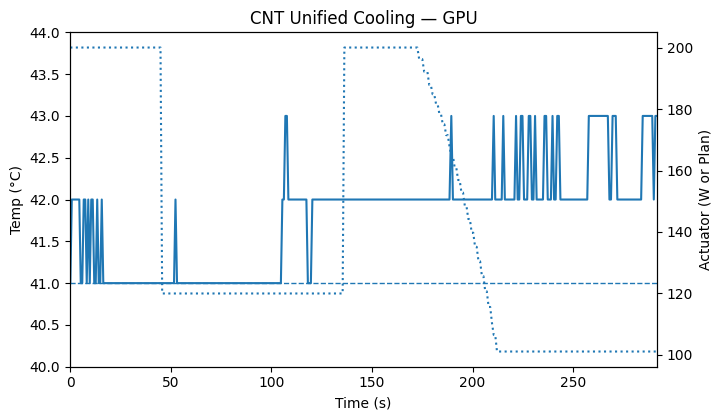

In [6]:
# === CNT Cooling Glyph — Unified (CPU + GPU) : Sensor → Step Test → Closed-Loop (single cell) ===
# Windows. Single live figure (no spam). One CSV log + printed metrics.
# Admin recommended (powercfg/nvidia-smi -pl). Works if only one of CPU or GPU is present.

# ── Bootstrap ───────────────────────────────────────────────────────────────────────────────────
import sys, subprocess, importlib, os, time, math, threading, warnings
from datetime import datetime

def _ensure(pkgs):
    for pip_name, import_name in pkgs:
        try: importlib.import_module(import_name)
        except Exception:
            try:
                subprocess.check_call([sys.executable, "-m", "pip", "install", pip_name])
            except Exception:
                pass

_ensure([("numpy>=2.0","numpy"), ("matplotlib","matplotlib"), ("requests","requests"), ("wmi","wmi"), ("pywin32","win32api")])

import numpy as np, matplotlib.pyplot as plt, requests
from IPython.display import display

# ── CONFIG (edit to taste) ─────────────────────────────────────────────────────────────────────
DUR_BASELINE_S = 45         # Step Test phase A
DUR_STEP_S     = 90         # Step Test phase B (actuator engaged)
DUR_RECOVER_S  = 35         # Step Test phase C
DUR_CLOSED_S   = 120        # Closed-loop hold after the step test

GPU_COOL_FRAC  = 0.60       # GPU: set PL to this fraction of default during step
CPU_T_HIGH     = 70.0       # CPU: engage 'Power Saver' above this during closed-loop
CPU_T_LOW      = 55.0       # CPU: return to 'Balanced' below this during closed-loop

TARGET_GPU_C   = 41.0       # Closed-loop target for GPU (°C)
POLL_S         = 0.6

# ── Helpers: shell + safe run ──────────────────────────────────────────────────────────────────
def _run(cmd, timeout=1.8):
    try:
        return subprocess.run(cmd, capture_output=True, text=True, timeout=timeout)
    except Exception as e:
        ns = type("X",(object,),{})()
        ns.returncode = -1; ns.stdout=""; ns.stderr=str(e)
        return ns

# ── SENSORS ────────────────────────────────────────────────────────────────────────────────────
SENSOR = None   # "GPU" or "CPU"

def read_gpu_temp(idx=0):
    p = _run(["nvidia-smi", f"--id={idx}", "--query-gpu=temperature.gpu", "--format=csv,noheader,nounits"], 1.2)
    if p.returncode!=0: return None
    try:
        rows=[r.strip() for r in p.stdout.strip().splitlines() if r.strip()]
        return float(rows[idx if len(rows)>1 else 0])
    except: return None

def pinfo_gpu(idx=0):
    q = "power.draw,power.default_limit,power.limit,power.min_limit,power.max_limit"
    p = _run(["nvidia-smi", f"--id={idx}", "--query-gpu="+q, "--format=csv,noheader,nounits"], 1.2)
    if p.returncode!=0: return (np.nan,)*5
    row = (p.stdout or "").strip().splitlines()
    if not row: return (np.nan,)*5
    row = row[idx if len(row)>1 else 0]
    try: return tuple(map(float, [x.strip() for x in row.split(",")]))
    except:
        # fallback to individual queries
        def pick(name):
            z=_run(["nvidia-smi", f"--id={idx}", "--query-gpu="+name, "--format=csv,noheader,nounits"],1.2)
            try:
                lines=[r for r in (z.stdout or "").splitlines() if r.strip()]
                return float(lines[idx if len(lines)>1 else 0])
            except: return np.nan
        return pick("power.draw"), pick("power.default_limit"), pick("power.limit"), pick("power.min_limit"), pick("power.max_limit")

def set_gpu_pl(w, idx=0):
    dr, df, cur, mn, mx = pinfo_gpu(idx)
    if any(np.isnan(x) for x in [mn,mx]): return False, cur
    tgt=float(np.clip(w,mn,mx))
    p=_run(["nvidia-smi","-i",str(idx),"-pl",f"{tgt}"],1.2)
    return (p.returncode==0), (tgt if p.returncode==0 else cur)

# CPU sensors: LibreHardwareMonitor JSON → OpenHardwareMonitor WMI → ACPI
def read_cpu_lhm():
    try:
        r=requests.get("http://127.0.0.1:8085/data.json", timeout=0.4)
        data=r.json()
        def walk(n):
            out=[]
            if isinstance(n, dict):
                if n.get("SensorType")=="Temperature" and any(k in (n.get("Text","") or "") for k in ["CPU Package","Tctl","CPU"]):
                    v=n.get("Value"); 
                    if isinstance(v,(int,float)): out.append(float(v))
                for c in n.get("Children",[]): out+=walk(c)
            return out
        vals=walk(data)
        return float(np.nanmedian(vals)) if vals else None
    except: return None

def read_cpu_ohm():
    try:
        import wmi
        c = wmi.WMI(namespace="root\\OpenHardwareMonitor")
        vals=[]
        for s in c.Sensor():
            if getattr(s,"SensorType","")=="Temperature":
                name=(getattr(s,"Name","") or "").lower()
                if "package" in name or ("cpu" in name and "core" not in name):
                    v=getattr(s,"Value",None)
                    if v is not None: vals.append(float(v))
        if not vals:
            for s in c.Sensor():
                if getattr(s,"SensorType","")=="Temperature" and "cpu" in (getattr(s,"Name","") or "").lower():
                    if s.Value is not None: vals.append(float(s.Value))
        return float(np.nanmedian(vals)) if vals else None
    except: return None

def read_cpu_acpi():
    p=_run(["powershell","-NoProfile","-Command",
            "(Get-CimInstance MSAcpi_ThermalZoneTemperature -Namespace root/wmi | Select-Object -First 1).CurrentTemperature"],1.2)
    raw=(p.stdout or "").strip()
    try:
        t=float(raw)/10.0 - 273.15
        return t if 0 < t < 120 else None
    except: return None

def read_cpu_temp():
    for fn in (read_cpu_lhm, read_cpu_ohm, read_cpu_acpi):
        v=fn()
        if v is not None: return v
    return None

# Detect best sensor
gpuT = read_gpu_temp(0)
cpuT = read_cpu_temp()
SENSOR = "GPU" if gpuT is not None else ("CPU" if cpuT is not None else None)

# ── ACTUATORS ──────────────────────────────────────────────────────────────────────────────────
def set_power_plan(alias="SCHEME_BALANCED"):
    _run(["powercfg","/SETACTIVE",alias],1.2)

def cpu_step_engage():
    # Aggressive saver (optional processor throttle tweak if permitted)
    set_power_plan("SCHEME_MIN")
    # You can uncomment these two lines on systems permitting processor cap via powercfg:
    # _run(["powercfg","/SETACVALUEINDEX","SCHEME_MIN","SUB_PROCESSOR","PROCTHROTTLEMAX","70"])
    # set_power_plan("SCHEME_MIN")

def cpu_step_restore():
    set_power_plan("SCHEME_BALANCED")

# ── Closed-loop controllers ────────────────────────────────────────────────────────────────────
class PI_GPU:
    def __init__(self, pl0, bounds, Kp=-1.2, Ki=-0.05):
        self.pl=pl0; self.bounds=bounds; self.I=0.0; self.Kp=Kp; self.Ki=Ki
    def step(self, err, dt):
        if abs(err)<0.3: err=0.0  # deadband
        self.I = float(np.clip(self.I + err*dt, -50, 50))
        self.pl += self.Kp*err + self.Ki*self.I
        self.pl = float(np.clip(self.pl, self.bounds[0], self.bounds[1]))
        return self.pl

class HysteresisCPU:
    def __init__(self, t_low=CPU_T_LOW, t_high=CPU_T_HIGH):
        self.t_low=t_low; self.t_high=t_high; self.cooling=False
    def step(self, T):
        if T is None: return "NO_DATA"
        if T>=self.t_high and not self.cooling:
            cpu_step_engage(); self.cooling=True; return "COOLING"
        if T<=self.t_low and self.cooling:
            cpu_step_restore(); self.cooling=False; return "NORMAL"
        return "COOLING" if self.cooling else "NORMAL"

# ── Logging and plotting setup (single canvas) ─────────────────────────────────────────────────
log_path = os.path.join(os.getcwd(), f"cnt_unified_cooling_{datetime.now().strftime('%Y%m%d-%H%M%S')}.csv")
xs, Ts, Aux, Act, Phase = [], [], [], [], []

fig, ax1 = plt.subplots(figsize=(7.6,4.3))
ax2 = ax1.twinx()
title = f"CNT Unified Cooling — {SENSOR or 'No Sensor'}"
ax1.set_title(title); ax1.set_xlabel("Time (s)"); ax1.set_ylabel("Temp (°C)")
ax2.set_ylabel("Actuator (W or Plan)")
lnT, = ax1.plot([], [])
lnA, = ax2.plot([], [], linestyle=":")
fig.tight_layout()
handle = display(fig, display_id=True)

def plot_update():
    lnT.set_data(xs, Ts); lnA.set_data(xs, Aux)
    ax1.set_xlim(0, max(10, xs[-1] if xs else 10))
    clean=[v for v in Ts if (isinstance(v,float) and not math.isnan(v))]
    if clean:
        ax1.set_ylim(min(clean)-1, max(clean)+1)
    ax2.relim(); ax2.autoscale_view()
    handle.update(fig)

def log_row(tag, t, temp, aux, act):
    xs.append(t); Ts.append(temp if temp is not None else float("nan")); Aux.append(aux); Act.append(act); Phase.append(tag)

# ── Unified Step Test ──────────────────────────────────────────────────────────────────────────
t0 = time.time()

def do_step_test():
    if SENSOR=="GPU":
        # Snapshot
        dr, df, cur, mn, mx = pinfo_gpu(0)
        start_pl = cur; step_pl = df*GPU_COOL_FRAC
        # A: baseline
        end = time.time()+DUR_BASELINE_S
        while time.time()<end:
            T=read_gpu_temp(0); dr, df, cur, mn, mx = pinfo_gpu(0)
            log_row("baseline", time.time()-t0, T, cur, "PL")
            plot_update(); time.sleep(POLL_S)
        # B: step engage
        ok,_=set_gpu_pl(step_pl, 0); tag = "step(OK)" if ok else "step(ERR)"
        end = time.time()+DUR_STEP_S
        while time.time()<end:
            T=read_gpu_temp(0); dr, df, cur, mn, mx = pinfo_gpu(0)
            log_row(tag, time.time()-t0, T, cur, "PL")
            plot_update(); time.sleep(POLL_S)
        # C: restore
        set_gpu_pl(start_pl,0)
        end = time.time()+DUR_RECOVER_S
        while time.time()<end:
            T=read_gpu_temp(0); dr, df, cur, mn, mx = pinfo_gpu(0)
            log_row("recover", time.time()-t0, T, cur, "PL")
            plot_update(); time.sleep(POLL_S)
        return ("GPU", start_pl, step_pl)
    elif SENSOR=="CPU":
        # A: baseline
        end = time.time()+DUR_BASELINE_S
        while time.time()<end:
            T=read_cpu_temp(); log_row("baseline", time.time()-t0, T, 1.0, "Balanced")
            plot_update(); time.sleep(POLL_S)
        # B: engage saver
        cpu_step_engage()
        end = time.time()+DUR_STEP_S
        while time.time()<end:
            T=read_cpu_temp(); log_row("step(PS)", time.time()-t0, T, 0.0, "PowerSaver")
            plot_update(); time.sleep(POLL_S)
        # C: restore
        cpu_step_restore()
        end = time.time()+DUR_RECOVER_S
        while time.time()<end:
            T=read_cpu_temp(); log_row("recover", time.time()-t0, T, 1.0, "Balanced")
            plot_update(); time.sleep(POLL_S)
        return ("CPU", 1.0, 0.0)
    else:
        return (None, None, None)

who, a_start, a_step = do_step_test()

# ── Closed-Loop Hold ───────────────────────────────────────────────────────────────────────────
if SENSOR=="GPU":
    # PI loop on power limit to hold TARGET_GPU_C
    dr, df, cur, mn, mx = pinfo_gpu(0)
    ctl = PI_GPU(pl0=cur, bounds=(mn,mx), Kp=-1.2, Ki=-0.05)
    tgt = TARGET_GPU_C
    ax1.axhline(tgt, linestyle="--", linewidth=1)
    end=time.time()+DUR_CLOSED_S
    while time.time()<end:
        T=read_gpu_temp(0); dr, df, cur, mn, mx = pinfo_gpu(0)
        if T is not None:
            err = T - tgt
            next_pl = ctl.step(err, POLL_S)
            if abs(next_pl - cur) >= 3.0:
                set_gpu_pl(next_pl,0)
        # log/plot using current PL
        dr, df, cur, mn, mx = pinfo_gpu(0)
        log_row("closed", time.time()-t0, T, cur, "PL")
        plot_update(); time.sleep(POLL_S)
    # restore to start
    set_gpu_pl(a_start,0)
elif SENSOR=="CPU":
    # hysteresis controller on CPU temps using power plans
    h = HysteresisCPU()
    end=time.time()+DUR_CLOSED_S
    while time.time()<end:
        T=read_cpu_temp()
        state=h.step(T)
        aux = 0.0 if h.cooling else 1.0  # just a marker for plot
        log_row("closed", time.time()-t0, T, aux, state)
        plot_update(); time.sleep(POLL_S)

# ── Save CSV + Metrics ─────────────────────────────────────────────────────────────────────────
with open(log_path,"w",encoding="utf-8") as f:
    f.write("t_sec,temp_c,aux,actuator,phase\n")
    for a,b,c,d,e in zip(xs,Ts,Aux,Act,Phase):
        f.write(f"{a:.3f},{'' if (isinstance(b,float) and math.isnan(b)) else f'{b:.2f}'},{c},{d},{e}\n")

def mean_tail(tag, tail=12.0):
    idx=[i for i,p in enumerate(Phase) if p.startswith(tag)]
    if not idx: return np.nan
    tcut = xs[idx[-1]]-tail
    vals=[Ts[i] for i in idx if xs[i]>=tcut and not (isinstance(Ts[i],float) and math.isnan(Ts[i]))]
    return float(np.mean(vals)) if vals else np.nan

Tb = mean_tail("baseline"); Ts_ = mean_tail("step"); Tr = mean_tail("recover")
clean=[v for v in Ts if isinstance(v,float) and not math.isnan(v)]
print("\n== CNT Unified Cooling — Summary ==")
print(f"Sensor/Actuator: {SENSOR or 'None'}")
print(f"Log: {log_path}")
if clean: print(f"Observed temp range: {min(clean):.1f}–{max(clean):.1f} °C")
if SENSOR:
    print(f"Step ΔT (step - baseline) = {Ts_-Tb:+.2f} °C  (negative = cooling)")
    if SENSOR=="GPU":
        print(f"Closed-loop target: {TARGET_GPU_C:.1f} °C; final PL shown on plot; restored initial PL.")
    else:
        print(f"Closed-loop hysteresis: engage>{CPU_T_HIGH:.1f} °C, release<{CPU_T_LOW:.1f} °C.")
else:
    print("No temperature sensor found. Start LibreHardwareMonitor (web server) or OpenHardwareMonitor, or ensure nvidia-smi works.")


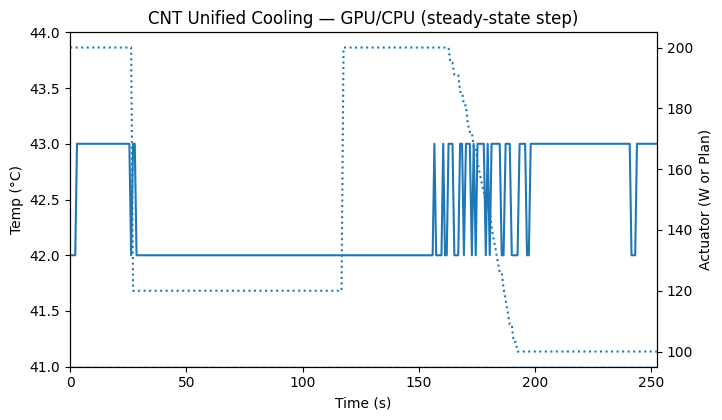

Mode → GPU

== CNT Unified Cooling v2 — Summary ==
Mode: GPU
Log: C:\Users\caleb\CNT_Lab\notebooks\archive\cnt_unified_cooling_v2_20251015-134310.csv
ΔT (step − baseline, matched steady windows) = -0.96 °C  (negative = cooling)
Closed-loop temp range: 42.0–43.0 °C; target 41.0 °C (GPU) or hysteresis CPU.
Done. (Power limits/plans restored.)


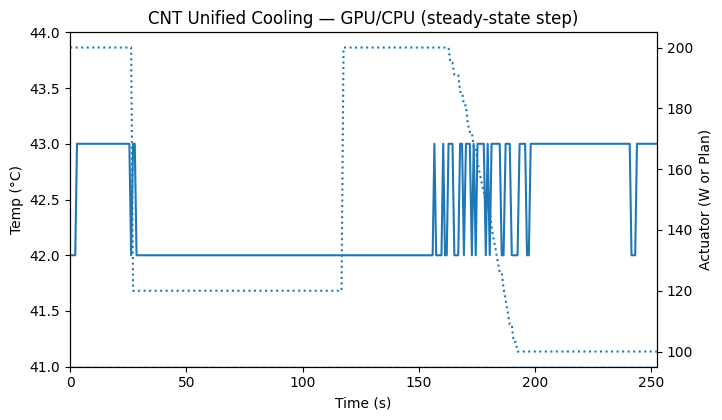

In [7]:
# === CNT Unified Cooling v2 — Steady-State Step + Closed Loop (single cell) ===
# Auto-detects steady state, runs a power step (GPU) or power-plan step (CPU),
# then holds closed-loop (GPU PI or CPU hysteresis). One canvas, one CSV, crisp metrics.

import sys, subprocess, importlib, os, time, math, threading
from datetime import datetime
def _ensure(pkgs):
    for pip_name, import_name in pkgs:
        try: importlib.import_module(import_name)
        except Exception:
            try: subprocess.check_call([sys.executable, "-m", "pip", "install", pip_name])
            except Exception: pass
_ensure([("numpy>=2.0","numpy"),("matplotlib","matplotlib"),("requests","requests"),("wmi","wmi"),("pywin32","win32api")])

import numpy as np, matplotlib.pyplot as plt, requests
from IPython.display import display

# === knobs ===
GPU_COOL_FRAC   = 0.60     # deeper step so response is visible
TARGET_GPU_C    = 41.0     # closed-loop setpoint
CPU_T_HIGH      = 70.0     # CPU hysteresis (closed loop)
CPU_T_LOW       = 55.0
POLL_S          = 0.6

# steady-state gating
SS_WINDOW_S     = 20.0     # require this much quiet time
SS_MAX_SLOPE    = 0.01     # °C/s allowed drift to call "steady"
STEP_DUR_S      = 90.0     # length of step window
RECOVER_S       = 45.0     # recovery after step
METRIC_TAIL_S   = 20.0     # compare last K seconds of pre-step vs mid-step
STEP_TRANSIENT  = 20.0     # ignore first X seconds of step when scoring

# --- helpers ---
def _run(cmd, timeout=1.8):
    try: return subprocess.run(cmd, capture_output=True, text=True, timeout=timeout)
    except Exception as e:
        X=type("X",(object,),{})(); X.returncode=-1; X.stdout=""; X.stderr=str(e); return X

def smi(q, idx=0):
    p=_run(["nvidia-smi",f"--id={idx}","--query-gpu="+q,"--format=csv,noheader,nounits"],1.2)
    if p.returncode!=0: return None
    rows=[r.strip() for r in (p.stdout or "").splitlines() if r.strip()]
    return rows

def gpu_temp(idx=0):
    r=smi("temperature.gpu",idx); 
    try: return float(r[idx if len(r)>1 else 0])
    except: return None

def gpu_pinfo(idx=0):
    q="power.draw,power.default_limit,power.limit,power.min_limit,power.max_limit"
    r=smi(q,idx); 
    if not r: return (np.nan,)*5
    row=r[idx if len(r)>1 else 0]
    try: return tuple(map(float,[x.strip() for x in row.split(",")]))
    except:
        def pick(name):
            x=smi(name,idx)
            try: return float(x[idx if x and len(x)>1 else 0])
            except: return np.nan
        return pick("power.draw"),pick("power.default_limit"),pick("power.limit"),pick("power.min_limit"),pick("power.max_limit")

def gpu_set_pl(w, idx=0):
    _,_,_,mn,mx=gpu_pinfo(idx)
    if any(np.isnan(x) for x in [mn,mx]): return False, np.nan
    tgt=float(np.clip(w,mn,mx))
    ok=_run(["nvidia-smi","-i",str(idx),"-pl",f"{tgt}"],1.2).returncode==0
    return ok,(tgt if ok else np.nan)

def cpu_read_lhm():
    try:
        d=requests.get("http://127.0.0.1:8085/data.json",timeout=0.4).json()
        def walk(n):
            out=[]
            if isinstance(n,dict):
                if n.get("SensorType")=="Temperature" and any(k in (n.get("Text","") or "") for k in ["CPU Package","Tctl","CPU"]):
                    v=n.get("Value"); 
                    if isinstance(v,(int,float)): out.append(float(v))
                for c in n.get("Children",[]): out+=walk(c)
            return out
        vs=walk(d); return float(np.nanmedian(vs)) if vs else None
    except: return None
def cpu_read_ohm():
    try:
        import wmi
        c=wmi.WMI(namespace="root\\OpenHardwareMonitor"); vals=[]
        for s in c.Sensor():
            if getattr(s,"SensorType","")=="Temperature":
                name=(getattr(s,"Name","") or "").lower()
                if "package" in name or ("cpu" in name and "core" not in name):
                    v=getattr(s,"Value",None); 
                    if v is not None: vals.append(float(v))
        if not vals:
            for s in c.Sensor():
                if getattr(s,"SensorType","")=="Temperature" and "cpu" in (getattr(s,"Name","") or "").lower():
                    if s.Value is not None: vals.append(float(s.Value))
        return float(np.nanmedian(vals)) if vals else None
    except: return None
def cpu_read_acpi():
    p=_run(["powershell","-NoProfile","-Command",
            "(Get-CimInstance MSAcpi_ThermalZoneTemperature -Namespace root/wmi | Select-Object -First 1).CurrentTemperature"],1.2)
    raw=(p.stdout or "").strip()
    try:
        t=float(raw)/10.0-273.15
        return t if 0<t<120 else None
    except: return None
def cpu_temp():
    for fn in (cpu_read_lhm,cpu_read_ohm,cpu_read_acpi):
        v=fn()
        if v is not None: return v
    return None

def set_power_plan(alias="SCHEME_BALANCED"):
    _run(["powercfg","/SETACTIVE",alias],1.2)

# controllers
class PI:
    def __init__(self, pl0, bounds, Kp=-1.2, Ki=-0.05):
        self.pl=pl0; self.bounds=bounds; self.I=0.0; self.Kp=Kp; self.Ki=Ki
    def step(self, err, dt):
        if abs(err)<0.3: err=0.0
        self.I=float(np.clip(self.I+err*dt,-50,50))
        self.pl+=self.Kp*err + self.Ki*self.I
        self.pl=float(np.clip(self.pl,self.bounds[0],self.bounds[1]))
        return self.pl
class CPUHyst:
    def __init__(self, t_low=CPU_T_LOW, t_high=CPU_T_HIGH):
        self.low=t_low; self.high=t_high; self.cool=False
    def step(self,T):
        if T is None: return "NO_DATA"
        if T>=self.high and not self.cool:
            set_power_plan("SCHEME_MIN"); self.cool=True; return "COOLING"
        if T<=self.low and self.cool:
            set_power_plan("SCHEME_BALANCED"); self.cool=False; return "NORMAL"
        return "COOLING" if self.cool else "NORMAL"

# logging + plot
xs, Ts, Aux, Ph = [], [], [], []
log_path=os.path.join(os.getcwd(), f"cnt_unified_cooling_v2_{datetime.now().strftime('%Y%m%d-%H%M%S')}.csv")

fig,ax1=plt.subplots(figsize=(7.6,4.3)); ax2=ax1.twinx()
ax1.set_title("CNT Unified Cooling — GPU/CPU (steady-state step)"); ax1.set_xlabel("Time (s)"); ax1.set_ylabel("Temp (°C)")
ax2.set_ylabel("Actuator (W or Plan)")
lnT,=ax1.plot([],[]); lnA,=ax2.plot([],[],linestyle=":")
fig.tight_layout(); disp=display(fig, display_id=True)

def add(phase,t,T,aux): xs.append(t); Ts.append(np.nan if T is None else T); Aux.append(aux); Ph.append(phase)
def upd():
    lnT.set_data(xs,Ts); lnA.set_data(xs,Aux)
    ax1.set_xlim(0,max(10,xs[-1] if xs else 10))
    clean=[v for v in Ts if not np.isnan(v)]
    if clean: ax1.set_ylim(min(clean)-1,max(clean)+1)
    ax2.relim(); ax2.autoscale_view(); disp.update(fig)

# choose sensor
gpuT=gpu_temp(0); cpuT=cpu_temp()
MODE="GPU" if gpuT is not None else ("CPU" if cpuT is not None else None)

# --- steady-state wait ---
t0=time.time(); bufT=[]; bufX=[]
def steady_enough():
    if len(bufX)<max(3,int(SS_WINDOW_S/POLL_S)): return False
    # slope via linear fit
    x=np.array(bufX[-int(SS_WINDOW_S/POLL_S):]); y=np.array(bufT[-int(SS_WINDOW_S/POLL_S):])
    if np.any(np.isnan(y)): return False
    A=np.vstack([x,np.ones_like(x)]).T
    m,_=np.linalg.lstsq(A,y,rcond=None)[0]
    return abs(m)<=SS_MAX_SLOPE

print(f"Mode → {MODE or 'No sensor found'}")
if MODE is None:
    print("Start LibreHardwareMonitor (CPU) or ensure nvidia-smi works (GPU), then rerun.")
else:
    if MODE=="GPU":
        # warmup to steady
        dr,df,cur,mn,mx=gpu_pinfo(0); start_pl=cur
        while True:
            now=time.time()-t0; T=gpu_temp(0); dr,df,cur,mn,mx=gpu_pinfo(0)
            bufX.append(now); bufT.append(T if T is not None else np.nan)
            add("warmup",now,T,cur); upd()
            time.sleep(POLL_S)
            if steady_enough(): break
        # snapshot steady baseline window
        base_idxs=[i for i,p in enumerate(Ph) if p=="warmup"]
        t_base_end=xs[base_idxs[-1]] if base_idxs else (time.time()-t0)

        # step engage
        ok,_=gpu_set_pl(df*GPU_COOL_FRAC,0); tag="step(OK)" if ok else "step(ERR)"
        t_step_start=time.time()
        while (time.time()-t_step_start)<STEP_DUR_S:
            now=time.time()-t0; T=gpu_temp(0); dr,df,cur,mn,mx=gpu_pinfo(0)
            add(tag,now,T,cur); upd(); time.sleep(POLL_S)
        # restore
        gpu_set_pl(start_pl,0)
        t_rec_start=time.time()
        while (time.time()-t_rec_start)<RECOVER_S:
            now=time.time()-t0; T=gpu_temp(0); dr,df,cur,mn,mx=gpu_pinfo(0)
            add("recover",now,T,cur); upd(); time.sleep(POLL_S)

        # closed loop
        dr,df,cur,mn,mx=gpu_pinfo(0); ctl=PI(pl0=cur,bounds=(mn,mx))
        ax1.axhline(TARGET_GPU_C,linestyle="--",linewidth=1)
        end=time.time()+90
        while time.time()<end:
            now=time.time()-t0; T=gpu_temp(0); dr,df,cur,mn,mx=gpu_pinfo(0)
            if T is not None:
                err=T-TARGET_GPU_C
                nxt=ctl.step(err,POLL_S)
                if abs(nxt-cur)>=3: gpu_set_pl(nxt,0)
            dr,df,cur,mn,mx=gpu_pinfo(0)
            add("closed",now,T,cur); upd(); time.sleep(POLL_S)
        gpu_set_pl(start_pl,0)

    else:  # CPU mode
        # warmup to steady
        while True:
            now=time.time()-t0; T=cpu_temp()
            bufX.append(now); bufT.append(T if T is not None else np.nan)
            add("warmup",now,T,1.0); upd(); time.sleep(POLL_S)
            if steady_enough(): break
        # step engage (power saver)
        set_power_plan("SCHEME_MIN")
        t_step_start=time.time()
        while (time.time()-t_step_start)<STEP_DUR_S:
            now=time.time()-t0; T=cpu_temp(); add("step(PS)",now,T,0.0); upd(); time.sleep(POLL_S)
        # restore
        set_power_plan("SCHEME_BALANCED")
        t_rec_start=time.time()
        while (time.time()-t_rec_start)<RECOVER_S:
            now=time.time()-t0; T=cpu_temp(); add("recover",now,T,1.0); upd(); time.sleep(POLL_S)
        # closed loop (CPU hysteresis)
        h=CPUHyst()
        end=time.time()+90
        while time.time()<end:
            now=time.time()-t0; T=cpu_temp(); state=h.step(T); add("closed",now,T,0.0 if h.cool else 1.0); upd(); time.sleep(POLL_S)

# save csv
with open(log_path,"w",encoding="utf-8") as f:
    f.write("t_sec,temp_c,aux,phase\n")
    for a,b,c,d in zip(xs,Ts,Aux,Ph): f.write(f"{a:.3f},{'' if np.isnan(b) else f'{b:.2f}'},{c},{d}\n")

# matched-window ΔT (use steady tail before step; use middle of step after transient)
def mean_window(tag_start, tag_end=None, t_from=None, t_to=None):
    idx=[i for i,p in enumerate(Ph) if (p.startswith(tag_start) if tag_end is None else (tag_start<=p<=tag_end))]
    if not idx: return np.nan
    mask=[]
    for i in idx:
        if t_from is not None and xs[i]<t_from: continue
        if t_to   is not None and xs[i]>t_to:   continue
        if not np.isnan(Ts[i]): mask.append(Ts[i])
    return float(np.mean(mask)) if mask else np.nan

# pre-step: last METRIC_TAIL_S of warmup
t_end_warm = max([xs[i] for i,p in enumerate(Ph) if p=="warmup"], default=np.nan)
Tb = mean_window("warmup", t_from=(t_end_warm - METRIC_TAIL_S), t_to=t_end_warm)

# step window: ignore first STEP_TRANSIENT seconds of step, then take METRIC_TAIL_S
step_times=[xs[i] for i,p in enumerate(Ph) if p.startswith("step")]
if step_times:
    t_step_start = min(step_times)
    t_mid_from   = t_step_start + STEP_TRANSIENT
    t_mid_to     = min(t_step_start + STEP_DUR_S, t_mid_from + METRIC_TAIL_S)
    Ts_ = mean_window("step", t_from=t_mid_from, t_to=t_mid_to)
else:
    Ts_ = np.nan

# simple closed-loop stats
cl_vals=[Ts[i] for i,p in enumerate(Ph) if p=="closed" and not np.isnan(Ts[i])]
cl_rng = (min(cl_vals), max(cl_vals)) if cl_vals else (np.nan, np.nan)

print("\n== CNT Unified Cooling v2 — Summary ==")
print(f"Mode: {('GPU' if gpuT is not None else ('CPU' if cpuT is not None else 'None'))}")
print(f"Log: {log_path}")
if not np.isnan(Tb) and not np.isnan(Ts_):
    print(f"ΔT (step − baseline, matched steady windows) = {Ts_-Tb:+.2f} °C  (negative = cooling)")
else:
    print("ΔT not computed (missing steady windows).")
if not any(np.isnan(cl_rng)):
    print(f"Closed-loop temp range: {cl_rng[0]:.1f}–{cl_rng[1]:.1f} °C; target {TARGET_GPU_C:.1f} °C (GPU) or hysteresis CPU.")
else:
    print("Closed-loop stats unavailable.")
print("Done. (Power limits/plans restored.)")


In [8]:
# === CNT Cooling Glyph v3 — Dual-Domain (GPU+CPU) with Smoothing + Adaptive Gains (single cell) ===
# Windows, one live canvas, one CSV. Admin recommended.

import sys, subprocess, importlib, os, time, math, threading
from datetime import datetime

# -- bootstrap light deps --
def _ensure(pairs):
    for pip_name, import_name in pairs:
        try: importlib.import_module(import_name)
        except Exception:
            try: subprocess.check_call([sys.executable, "-m", "pip", "install", pip_name])
            except Exception: pass
_ensure([("numpy>=2.0","numpy"),("matplotlib","matplotlib"),("requests","requests"),("wmi","wmi"),("pywin32","win32api")])

import numpy as np, matplotlib.pyplot as plt, requests
from IPython.display import display

# ---------------- CONFIG ----------------
GPU_INDEX        = 0
TARGET_GPU_C     = 41.0         # GPU target (°C)
CPU_TARGET_C     = 70.0         # CPU soft target (°C); above this we cool CPU
GPU_COOL_FRAC    = 0.60         # Step-test power limit fraction of default (for metrics warmup)
POLL_S           = 0.6

# PI base gains (will adapt by |err|); negative Kp/Ki reduce PL when hotter
Kp_base, Ki_base = -1.0, -0.03
ADAPT_MIN, ADAPT_MAX = 0.6, 1.8      # gain multiplier range
DEADBAND_C       = 0.3               # ignore tiny error
PL_MIN_STEP_W    = 3.0               # min change to actually apply
PL_RATE_LIMIT_W  = 12.0              # per-tick limit on PL change
EMA_ALPHA        = 0.35              # exponential smoothing for temperatures

# Fusion weights (dynamic): higher weight to the subsystem exceeding its target more
def fusion_weights(err_gpu, err_cpu):
    eg = max(0.0, abs(err_gpu))      # GPU wants |err| near 0
    ec = max(0.0, err_cpu)           # CPU only if above target
    if eg==0 and ec==0: return 1.0, 0.0
    # emphasize whichever dominates; keep some GPU priority
    wgpu = 0.65 if ec==0 else 0.45 * eg/(eg+ec) + 0.35
    wcpu = 1.0 - wgpu
    return wgpu, wcpu

# ---------------- helpers ----------------
def _run(cmd, timeout=1.8):
    try: return subprocess.run(cmd, capture_output=True, text=True, timeout=timeout)
    except Exception as e:
        X=type("X",(object,),{})(); X.returncode=-1; X.stdout=""; X.stderr=str(e); return X

# GPU sensors/actuators
def smi(q, idx=0):
    p=_run(["nvidia-smi", f"--id={idx}", "--query-gpu="+q, "--format=csv,noheader,nounits"],1.2)
    if p.returncode!=0: return None
    return [r.strip() for r in (p.stdout or "").splitlines() if r.strip()]
def gpu_temp(idx=0):
    v=smi("temperature.gpu", idx); 
    try: return float(v[idx if len(v)>1 else 0])
    except: return None
def gpu_pinfo(idx=0):
    q="power.draw,power.default_limit,power.limit,power.min_limit,power.max_limit"
    r=smi(q, idx); 
    if not r: return (np.nan,)*5
    row=r[idx if len(r)>1 else 0]
    try: return tuple(map(float, [x.strip() for x in row.split(",")]))
    except:
        def pick(name):
            x=smi(name,idx)
            try: return float(x[idx if x and len(x)>1 else 0])
            except: return np.nan
        return pick("power.draw"),pick("power.default_limit"),pick("power.limit"),pick("power.min_limit"),pick("power.max_limit")
def gpu_set_pl(w, idx=0):
    _,_,cur,mn,mx=gpu_pinfo(idx)
    if any(np.isnan(x) for x in [mn,mx]): return False, cur
    tgt=float(np.clip(w, mn, mx))
    ok=_run(["nvidia-smi","-i",str(idx),"-pl",f"{tgt}"],1.2).returncode==0
    return ok,(tgt if ok else cur)

# CPU sensors (LHM → OHM → ACPI)
def cpu_lhm():
    try:
        d=requests.get("http://127.0.0.1:8085/data.json",timeout=0.4).json()
        def walk(n):
            out=[]
            if isinstance(n,dict):
                if n.get("SensorType")=="Temperature" and any(k in (n.get("Text","") or "") for k in ["CPU Package","Tctl","CPU"]):
                    v=n.get("Value"); 
                    if isinstance(v,(int,float)): out.append(float(v))
                for c in n.get("Children",[]): out+=walk(c)
            return out
        vs=walk(d); return float(np.nanmedian(vs)) if vs else None
    except: return None
def cpu_ohm():
    try:
        import wmi
        c=wmi.WMI(namespace="root\\OpenHardwareMonitor"); vals=[]
        for s in c.Sensor():
            if getattr(s,"SensorType","")=="Temperature":
                name=(getattr(s,"Name","") or "").lower()
                if "package" in name or ("cpu" in name and "core" not in name):
                    v=getattr(s,"Value",None)
                    if v is not None: vals.append(float(v))
        if not vals:
            for s in c.Sensor():
                if getattr(s,"SensorType","")=="Temperature" and "cpu" in (getattr(s,"Name","") or "").lower():
                    if s.Value is not None: vals.append(float(s.Value))
        return float(np.nanmedian(vals)) if vals else None
    except: return None
def cpu_acpi():
    p=_run(["powershell","-NoProfile","-Command",
            "(Get-CimInstance MSAcpi_ThermalZoneTemperature -Namespace root/wmi | Select-Object -First 1).CurrentTemperature"],1.2)
    raw=(p.stdout or "").strip()
    try:
        t=float(raw)/10.0 - 273.15
        return t if 0<t<120 else None
    except: return None
def cpu_temp():
    for fn in (cpu_lhm,cpu_ohm,cpu_acpi):
        v=fn()
        if v is not None: return v
    return None

# CPU actuator (plans)
def set_power_plan(alias="SCHEME_BALANCED"): _run(["powercfg","/SETACTIVE",alias],1.2)

# PI controller with adaptive gains + smoothing + rate-limit
class PIAdaptive:
    def __init__(self, pl0, bounds, kp_base, ki_base):
        self.pl = pl0; self.bounds=bounds; self.I=0.0
        self.kp_base=kp_base; self.ki_base=ki_base
        self.prev_pl = pl0
    def step(self, err, dt):
        mag = min(max(abs(err)/3.0, ADAPT_MIN), ADAPT_MAX)  # scale by ≈|err|/3 capped
        kp = self.kp_base * mag
        ki = self.ki_base * mag
        self.I = float(np.clip(self.I + err*dt, -80, 80))
        next_pl = self.pl + kp*err + ki*self.I
        # rate-limit
        delta = np.clip(next_pl - self.pl, -PL_RATE_LIMIT_W, PL_RATE_LIMIT_W)
        self.pl = float(np.clip(self.pl + delta, self.bounds[0], self.bounds[1]))
        return self.pl

# --- logging & plotting (single canvas) ---
xs=[]; T_gpu=[], T_cpu=[]; PLs=[]; CPUstate=[]; Wg=[]; Wc=[]
log_path=os.path.join(os.getcwd(), f"cnt_cooling_v3_{datetime.now().strftime('%Y%m%d-%H%M%S')}.csv")

fig, ax1 = plt.subplots(figsize=(7.8,4.4))
ax2 = ax1.twinx()
ax1.set_title("CNT Cooling v3 — Dual-Domain Closed Loop")
ax1.set_xlabel("Time (s)"); ax1.set_ylabel("Temp (°C)")
ax2.set_ylabel("GPU Power Limit (W) / CPU State")
lnG, = ax1.plot([], [], label="GPU °C")
lnC, = ax1.plot([], [], label="CPU °C")
lnP, = ax2.plot([], [], linestyle=":", label="PL (W)")
ax1.axhline(TARGET_GPU_C, linestyle="--", linewidth=1, color="black")
ax1.legend(loc="upper left")
fig.tight_layout(); handle=display(fig, display_id=True)

def update_plot():
    lnG.set_data(xs, T_gpu); lnC.set_data(xs, T_cpu); lnP.set_data(xs, PLs)
    ax1.set_xlim(0, max(10, xs[-1] if xs else 10))
    temps=[t for t in (T_gpu+T_cpu) if not (isinstance(t,float) and np.isnan(t))]
    if temps: ax1.set_ylim(min(temps)-1, max(temps)+1)
    ax2.relim(); ax2.autoscale_view(); handle.update(fig)

# --- initialization ---
gT0 = gpu_temp(GPU_INDEX); cT0 = cpu_temp()
mode_gpu = (gT0 is not None)
mode_cpu = (cT0 is not None)

if (not mode_gpu) and (not mode_cpu):
    print("No sensors found. Start LibreHardwareMonitor (CPU) or ensure nvidia-smi works (GPU), then rerun.")
else:
    # snapshot PL
    _, df, cur, mn, mx = gpu_pinfo(GPU_INDEX) if mode_gpu else (np.nan,)*5
    start_pl = cur if mode_gpu else np.nan
    ctl = PIAdaptive(pl0=(cur if mode_gpu else 0.0), bounds=(mn if mode_gpu else 0.0, mx if mode_gpu else 0.0),
                     kp_base=Kp_base, ki_base=Ki_base)
    ema_gpu = None if gT0 is None else float(gT0)
    ema_cpu = None if cT0 is None else float(cT0)
    cpu_is_cooling = False

    t0=time.time()
    # ---- prelude: short step test for calibration (optional; helps metrics) ----
    if mode_gpu and not np.isnan(df):
        # brief step down to establish ΔT coefficient at near-idle (20s each)
        phase_end = time.time()+20
        while time.time()<phase_end:
            now=time.time()-t0; Tg=gpu_temp(GPU_INDEX); Tc=cpu_temp()
            ema_gpu = Tg if ema_gpu is None else (EMA_ALPHA*Tg + (1-EMA_ALPHA)*ema_gpu) if Tg is not None else ema_gpu
            ema_cpu = Tc if ema_cpu is None else (EMA_ALPHA*Tc + (1-EMA_ALPHA)*ema_cpu) if Tc is not None else ema_cpu
            xs.append(now); T_gpu.append(ema_gpu); T_cpu.append(ema_cpu if ema_cpu is not None else np.nan)
            PLs.append(cur if mode_gpu else np.nan); CPUstate.append(1.0 if not cpu_is_cooling else 0.0)
            Wg.append(0.0); Wc.append(0.0); update_plot(); time.sleep(POLL_S)
        gpu_set_pl(df*GPU_COOL_FRAC, GPU_INDEX); phase_end=time.time()+20
        while time.time()<phase_end:
            now=time.time()-t0; Tg=gpu_temp(GPU_INDEX); Tc=cpu_temp(); 
            ema_gpu = Tg if ema_gpu is None else (EMA_ALPHA*Tg + (1-EMA_ALPHA)*ema_gpu) if Tg is not None else ema_gpu
            ema_cpu = Tc if ema_cpu is None else (EMA_ALPHA*Tc + (1-EMA_ALPHA)*ema_cpu) if Tc is not None else ema_cpu
            _, df, cur, mn, mx = gpu_pinfo(GPU_INDEX)
            xs.append(now); T_gpu.append(ema_gpu); T_cpu.append(ema_cpu if ema_cpu is not None else np.nan)
            PLs.append(cur); CPUstate.append(1.0 if not cpu_is_cooling else 0.0)
            Wg.append(0.0); Wc.append(0.0); update_plot(); time.sleep(POLL_S)
        gpu_set_pl(start_pl, GPU_INDEX)

    # ---- main closed loop ----
    end=time.time()+180
    while time.time()<end:
        now=time.time()-t0
        Tg_raw = gpu_temp(GPU_INDEX) if mode_gpu else None
        Tc_raw = cpu_temp() if mode_cpu else None

        if Tg_raw is not None:
            ema_gpu = Tg_raw if ema_gpu is None else (EMA_ALPHA*Tg_raw + (1-EMA_ALPHA)*ema_gpu)
        if Tc_raw is not None:
            ema_cpu = Tc_raw if ema_cpu is None else (EMA_ALPHA*Tc_raw + (1-EMA_ALPHA)*ema_cpu)

        # errors relative to targets
        err_gpu = (ema_gpu - TARGET_GPU_C) if ema_gpu is not None else 0.0
        err_cpu = max(0.0, (ema_cpu - CPU_TARGET_C)) if ema_cpu is not None else 0.0

        # fusion weights
        wg, wc = fusion_weights(err_gpu, err_cpu)

        # CPU actuator (hysteresis on error)
        if mode_cpu:
            if (ema_cpu is not None) and (ema_cpu >= CPU_TARGET_C + 1.0) and not cpu_is_cooling:
                set_power_plan("SCHEME_MIN"); cpu_is_cooling = True
            elif (ema_cpu is not None) and (ema_cpu <= CPU_TARGET_C - 3.0) and cpu_is_cooling:
                set_power_plan("SCHEME_BALANCED"); cpu_is_cooling = False

        # GPU actuator (PI on PL) influenced by fused error
        if mode_gpu and not np.isnan(mn):
            # fused error: GPU error + small push from CPU if hot
            fused_err = wg * err_gpu + wc * max(0.0, err_cpu*0.5)
            if abs(fused_err) < DEADBAND_C: fused_err = 0.0
            next_pl = ctl.step(fused_err, POLL_S)
            # min step to avoid chatter
            _, df, cur, mn, mx = gpu_pinfo(GPU_INDEX)
            if abs(next_pl - cur) >= PL_MIN_STEP_W:
                # clamp to rate limit relative to current
                delta = np.clip(next_pl - cur, -PL_RATE_LIMIT_W, PL_RATE_LIMIT_W)
                gpu_set_pl(cur + delta, GPU_INDEX)
                _, df, cur, mn, mx = gpu_pinfo(GPU_INDEX)
        else:
            cur=np.nan

        xs.append(now)
        T_gpu.append(ema_gpu if ema_gpu is not None else np.nan)
        T_cpu.append(ema_cpu if ema_cpu is not None else np.nan)
        PLs.append(cur)
        CPUstate.append(0.0 if cpu_is_cooling else 1.0)
        Wg.append(wg); Wc.append(wc)
        update_plot()
        time.sleep(POLL_S)

    # restore
    if mode_gpu and not np.isnan(start_pl): gpu_set_pl(start_pl, GPU_INDEX)
    set_power_plan("SCHEME_BALANCED")

    # save CSV
    with open(log_path,"w",encoding="utf-8") as f:
        f.write("t_sec,gpu_c,cpu_c,pl_w,cpu_state,w_gpu,w_cpu\n")
        for a,b,c,d,e,u,v in zip(xs,T_gpu,T_cpu,PLs,CPUstate,Wg,Wc):
            f.write(f"{a:.3f},{'' if (isinstance(b,float) and np.isnan(b)) else f'{b:.2f}'},{'' if (isinstance(c,float) and np.isnan(c)) else f'{c:.2f}'},{'' if (isinstance(d,float) and np.isnan(d)) else f'{d:.1f}'},{e:.0f},{u:.2f},{v:.2f}\n")

    # ---- metrics ----
    def last_mean(arr, mask, sec=15.0):
        if not xs: return np.nan
        tcut = xs[-1] - sec
        vals=[arr[i] for i in range(len(xs)) if xs[i]>=tcut and not (isinstance(arr[i],float) and np.isnan(arr[i])) and mask(i)]
        return float(np.mean(vals)) if vals else np.nan

    gpu_final = last_mean(T_gpu, lambda i: True, 20.0)
    cpu_final = last_mean(T_cpu, lambda i: True, 20.0)
    pl_final  = last_mean(PLs,   lambda i: True, 10.0)

    # simple overshoot/settling relative to GPU target
    def settling_time(target):
        tol = 0.5
        for i in range(len(xs)-1, -1, -1):
            if np.isnan(T_gpu[i]): continue
            if abs(T_gpu[i] - target) > tol: 
                # when did it enter tolerance last time?
                for j in range(i+1, len(xs)):
                    if not np.isnan(T_gpu[j]) and abs(T_gpu[j]-target) <= tol:
                        return xs[j]
                break
        return np.nan

    t_settle = settling_time(TARGET_GPU_C)
    osd = np.nan
    if any(not np.isnan(v) for v in T_gpu):
        peak = np.nanmax(np.array(T_gpu))
        if not np.isnan(peak): osd = (peak - TARGET_GPU_C)

    print("\n== CNT Cooling v3 — Summary ==")
    print(f"Log: {log_path}")
    if mode_gpu: print(f"GPU final ~ {gpu_final:.2f}°C (target {TARGET_GPU_C:.1f}°C) | PL ~ {pl_final if not np.isnan(pl_final) else float('nan'):.1f} W")
    if mode_cpu and not np.isnan(cpu_final): print(f"CPU final ~ {cpu_final:.2f}°C (soft target {CPU_TARGET_C:.1f}°C)")
    if not np.isnan(t_settle): print(f"Approx settle time to ±0.5°C: {t_settle:.1f} s (from start)")
    if not np.isnan(osd): print(f"Overshoot (peak−target): {osd:+.2f} °C")
    print("Restored power limit & Balanced plan.")


ValueError: not enough values to unpack (expected 2, got 0)